In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.dates import (YEARLY, DateFormatter,
                              rrulewrapper, RRuleLocator, drange)
import datetime   # package that helps manipulate dates
import matplotlib.dates as mdates
import calendar

from dateutil.parser import parse     # package for date parsing
from prophet import Prophet
from pmdarima import auto_arima




In [2]:
shi_df = pd.read_csv('data/aqicn/shanghai.csv')
pzh_df = pd.read_csv('data/aqicn/panzhihua.csv')
btu_df = pd.read_csv('data/aqicn/baotou.csv')

# Aqicn data

If you are working with data from aqicn.org, then you need to run this code before using rolling_prophet_forcast_CI_with arima.

In [3]:
def change_df (df):
    data = df.copy()
    data.date = pd.to_datetime(data.date)
    data = data.sort_values(by ='date', ascending= False)

    data.columns = ['date','PM25','PM10','O3','NO2','SO2','CO']

    for col in data.columns:
        if col != 'date':
            data[col] = pd.to_numeric(data[col], errors ='coerce')
    data = data.dropna()
    data = data.sort_values('date', ascending =False)
    return data

shi_df = change_df(shi_df)
pzh_df = change_df(pzh_df)
btu_df = change_df(btu_df)


# Nasa data

If you are working with data from NASA, then you need to run this code before using rolling_prophet_forcast_CI_with_arima.

In [4]:
def cleaning_NASA_data(a, pollutant):
    """
    Cleans NASA CSV data: renames columns, drops metadata rows, converts types, sorts by date,
    and filters for positive values of the pollutant.
    """
    a.columns = ['date', pollutant]
    a.drop(list(range(0, 7)), inplace=True)  # drops first 7 rows, adjust if necessary
    a[pollutant] = pd.to_numeric(a[pollutant], errors='coerce')
    a['date'] = pd.to_datetime(a['date'])
    a = a.sort_values('date')
    a = a[a[pollutant] > 0]
    a = a.reset_index(drop=True)
    return a

btu_df_NASA = pd.read_csv("data/nasa_data/baotouNO2.csv")
btu_df_NASA = cleaning_NASA_data(btu_df_NASA, 'NO2')
btu_df = pd.read_csv('data/aqicn/baotou.csv')
btu_df = change_df(btu_df)

In [5]:
def make_agg(df, freq='D', pollutant='NO2'):
    df_agg = df.copy()
    df_agg['date'] = pd.to_datetime(df_agg['date'])
    if freq == 'D':
        df_agg = df_agg[['date', pollutant]]
        return df_agg.rename(columns={pollutant:  pollutant})
    elif freq == 'W':
        df_agg['date'] = df_agg['date'].dt.to_period('W').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant})
    elif freq == 'M':
        df_agg['date'] = df_agg['date'].dt.to_period('M').dt.start_time
        result = df_agg.groupby('date')[pollutant].mean().reset_index()
        return result.rename(columns={pollutant:  pollutant })
    else:
        raise ValueError("freq must be 'D', 'W', or 'M'")

# Baotou

00:06:10 - cmdstanpy - INFO - Chain [1] start processing
00:06:10 - cmdstanpy - INFO - Chain [1] done processing
00:06:10 - cmdstanpy - INFO - Chain [1] start processing
00:06:10 - cmdstanpy - INFO - Chain [1] done processing
00:06:10 - cmdstanpy - INFO - Chain [1] start processing
00:06:10 - cmdstanpy - INFO - Chain [1] done processing
00:06:11 - cmdstanpy - INFO - Chain [1] start processing
00:06:11 - cmdstanpy - INFO - Chain [1] done processing
00:06:11 - cmdstanpy - INFO - Chain [1] start processing
00:06:11 - cmdstanpy - INFO - Chain [1] done processing
00:06:11 - cmdstanpy - INFO - Chain [1] start processing
00:06:11 - cmdstanpy - INFO - Chain [1] done processing
00:06:11 - cmdstanpy - INFO - Chain [1] start processing
00:06:11 - cmdstanpy - INFO - Chain [1] done processing
00:06:11 - cmdstanpy - INFO - Chain [1] start processing
00:06:12 - cmdstanpy - INFO - Chain [1] done processing
00:06:12 - cmdstanpy - INFO - Chain [1] start processing
00:06:12 - cmdstanpy - INFO - Chain [1]

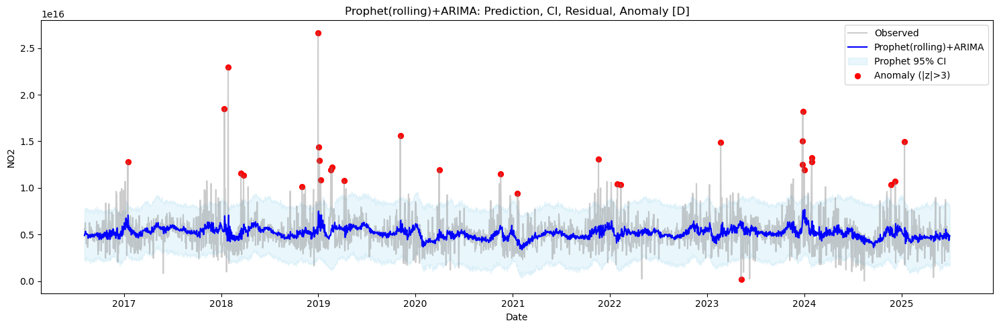

00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:55 - cmdstanpy - INFO - Chain [1] done processing
00:06:55 - cmdstanpy - INFO - Chain [1] start processing
00:06:56 - cmdstanpy - INFO - Chain [1] done processing
00:06:56 - cmdstanpy - INFO - Chain [1] start processing
00:06:56 - cmdstanpy - INFO - Chain [1] done processing
00:06:56 - cmdstanpy - INFO - Chain [1] start processing
00:06:56 - cmdstanpy - INFO - Chain [1] done processing
00:06:56 - cmdstanpy - INFO - Chain [1] start processing
00:06:56 - cmdstanpy - INFO - Chain [1] done processing
00:06:56 - cmdstanpy - INFO - Chain [1] start processing
00:06:56 - cmdstanpy - INFO - Chain [1]

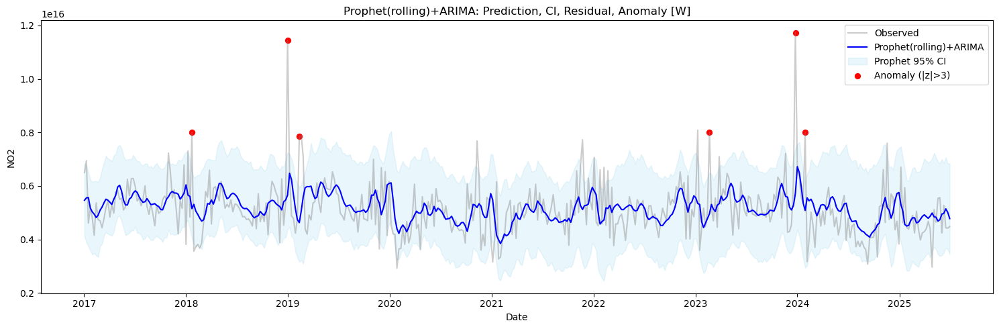

00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:15 - cmdstanpy - INFO - Chain [1] done processing
00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:15 - cmdstanpy - INFO - Chain [1] done processing
00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:16 - cmdstanpy - INFO - Chain [1] start processing
00:07:16 - cmdstanpy - INFO - Chain [1] done processing
00:07:17 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1] done processing
00:07:17 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1] done processing
00:07:17 - cmdstanpy - INFO - Chain [1] start processing
00:07:17 - cmdstanpy - INFO - Chain [1]

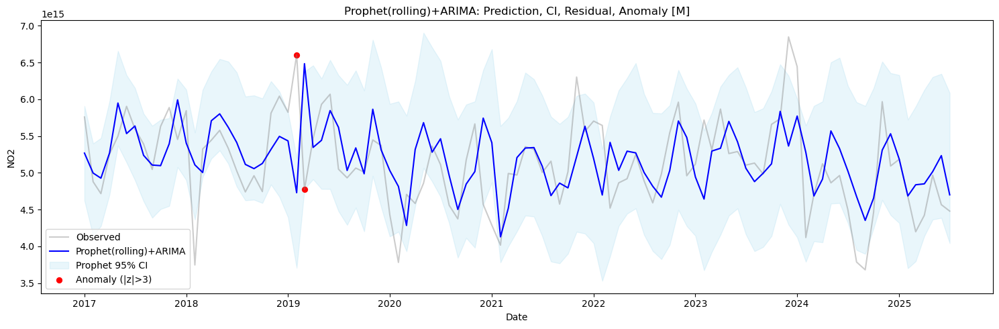

In [6]:
from pmdarima import auto_arima

def rolling_prophet_forecast_CI_with_arima(
    df, pollutant='no2', train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
):
    # Prophet rolling
    df = df.sort_values('date').reset_index(drop=True)
    df_prophet = df.rename(columns={'date':'ds', pollutant:'y'})[['ds','y']].dropna()
    results = []
    for train_end in range(train_steps, len(df_prophet)-test_steps+1, step):
        train = df_prophet.iloc[:train_end]
        test  = df_prophet.iloc[train_end:train_end+test_steps]
        m = Prophet(yearly_seasonality=True, weekly_seasonality=(freq!='M'), daily_seasonality=(freq=='D'), interval_width=0.95)
        m.fit(train)
        fcst = m.predict(test[['ds']])
        pred = fcst['yhat'].values
        lower = fcst['yhat_lower'].values
        upper = fcst['yhat_upper'].values
        y_true = test['y'].values
        for i in range(len(pred)):
            results.append({
                'ds': test['ds'].values[i],
                'real': y_true[i],
                'prophet_pred': pred[i],
                'lower_CI': lower[i],
                'upper_CI': upper[i]
            })
        del m

    results_df = pd.DataFrame(results)
    results_df = results_df.drop_duplicates(subset=['ds'])
    # Prophet residual
    results_df['residual'] = results_df['real'] - results_df['prophet_pred']
    # ARIMA modification
    arima_mod = auto_arima(results_df['residual'].values, seasonal=False, suppress_warnings=True, stepwise=True, error_action='ignore')
    arima_pred = arima_mod.predict_in_sample()
    results_df['arima_correction'] = arima_pred
    results_df['final_pred'] = results_df['prophet_pred'] + arima_pred
    results_df['arima_residual'] = results_df['real'] - results_df['final_pred']
    sigma = results_df['arima_residual'].std()
    results_df['zscore'] = results_df['arima_residual'] / sigma if sigma > 0 else 0
    results_df['outlier'] = np.abs(results_df['zscore']) > z_thresh

    if plot:
        plt.figure(figsize=(15,5))
        plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
        plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
        plt.fill_between(results_df['ds'], results_df['lower_CI'], results_df['upper_CI'], color='skyblue', alpha=0.18, label='Prophet 95% CI')
        plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                    results_df.loc[results_df['outlier'], 'real'],
                    color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
        plt.xlabel('Date'); plt.ylabel(pollutant.upper())
        plt.title(f'Prophet(rolling)+ARIMA: Prediction, CI, Residual, Anomaly [{freq}]')
        plt.legend(); plt.tight_layout(); plt.show()

    return results_df

# day/week/month rolling Prophet+ARIMA
daily_result = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

In [7]:
def plot_arima_anomaly_band(results_df, pollutant='NO2', shading_k=3, z_thresh=3, freq='D'):
    """
    results_df: DataFrame with columns ['ds', 'real', 'final_pred', 'arima_residual', 'outlier']
    """
    sigma = results_df['arima_residual'].std()
    # 신뢰구간 계산
    lower = results_df['final_pred'] - shading_k * sigma
    upper = results_df['final_pred'] + shading_k * sigma

    plt.figure(figsize=(15,5))
    plt.plot(results_df['ds'], results_df['real'], color='gray', alpha=0.4, label='Observed')
    plt.plot(results_df['ds'], results_df['final_pred'], color='blue', label='Prophet(rolling)+ARIMA')
    plt.fill_between(results_df['ds'], lower, upper, color='skyblue', alpha=0.18, label=f'Prophet+ARIMA ±{shading_k}σ')
    plt.scatter(results_df.loc[results_df['outlier'], 'ds'],
                results_df.loc[results_df['outlier'], 'real'],
                color='red', s=32, label=f'Anomaly (|z|>{z_thresh})')
    plt.xlabel('Date'); plt.ylabel(pollutant.upper())
    plt.title(f'Prophet(rolling)+ARIMA: Prediction, Anomaly Band, Outlier [{freq}]')
    plt.legend(); plt.tight_layout(); plt.show()

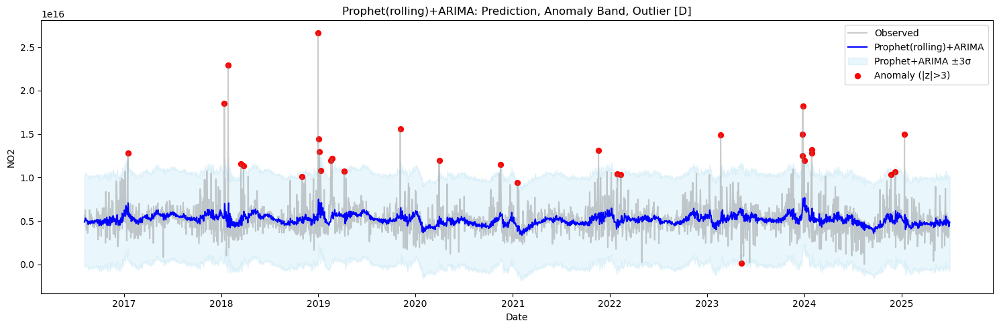

In [8]:
plot_arima_anomaly_band(daily_result, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')

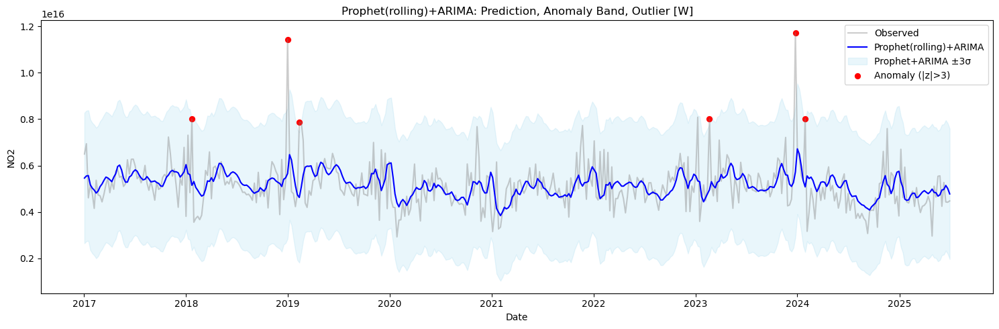

In [9]:
plot_arima_anomaly_band(weekly_result, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')


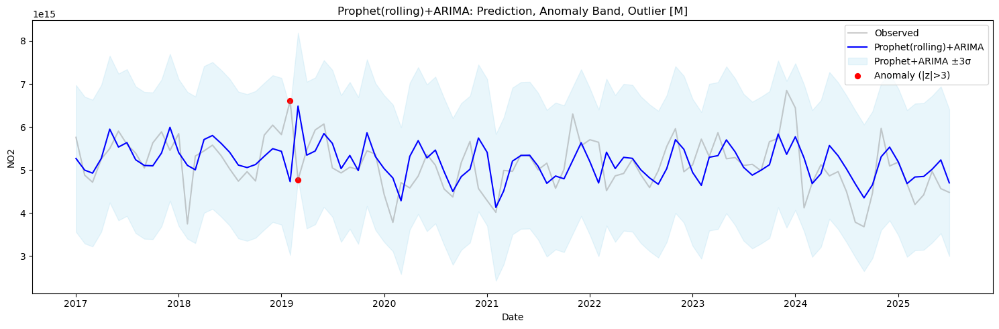

In [10]:
plot_arima_anomaly_band(monthly_result, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')


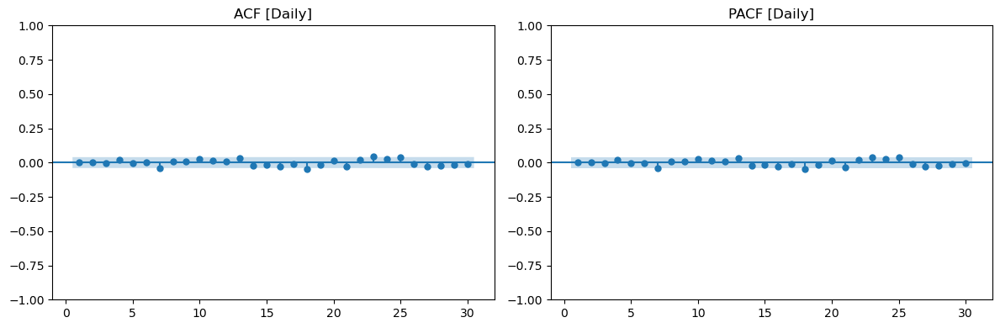

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   6.975877   0.727720
20  20.513345   0.426257
30  38.111922   0.146897



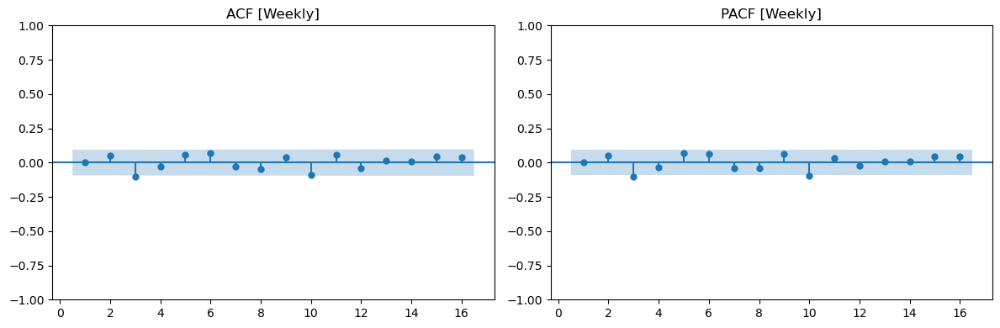

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   10.875083   0.208878
12  17.843728   0.120519
16  19.552557   0.241052



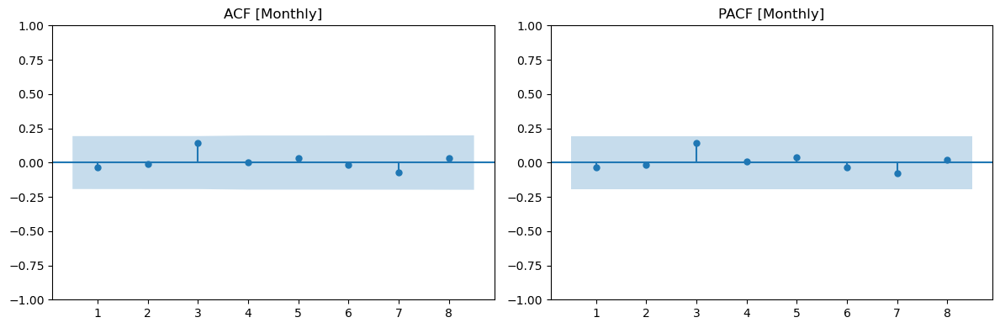

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  2.397090   0.663153
8  3.264277   0.916695



In [11]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
import matplotlib.pyplot as plt

def residual_diagnostics(res_df, lags=[10, 20, 30], title=''):
    resid = res_df['arima_residual'].values
    max_lags = min(max(lags), len(resid)//2 - 1)  # 데이터 길이에 맞춰 최대 lags 제한
    lags_to_use = [lag for lag in lags if lag <= max_lags]
    
    import matplotlib.pyplot as plt
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    from statsmodels.stats.diagnostic import acorr_ljungbox

    plt.figure(figsize=(12,4))
    plt.subplot(1,2,1)
    plot_acf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'ACF {title}')
    plt.subplot(1,2,2)
    plot_pacf(resid, lags=max_lags, zero=False, ax=plt.gca())
    plt.title(f'PACF {title}')
    plt.tight_layout()
    plt.show()

    lb = acorr_ljungbox(resid, lags=lags_to_use, return_df=True)
    print(f'Ljung-Box Test {title} (using lags {lags_to_use}):\n{lb}\n')

# Daily residual
residual_diagnostics(daily_result, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result, lags=[4,8], title='[Monthly]')

00:14:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:52 - cmdstanpy - INFO - Chain [1] done processing
00:14:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:52 - cmdstanpy - INFO - Chain [1] done processing
00:14:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:52 - cmdstanpy - INFO - Chain [1] done processing
00:14:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:52 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1] done processing
00:14:53 - cmdstanpy - INFO - Chain [1] start processing
00:14:53 - cmdstanpy - INFO - Chain [1]

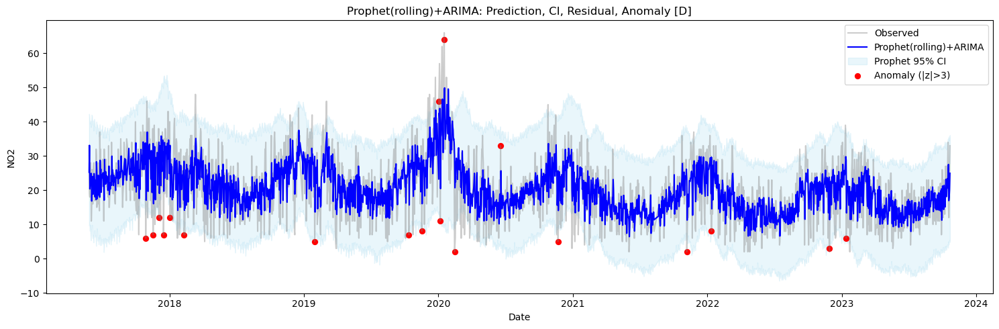

00:15:24 - cmdstanpy - INFO - Chain [1] start processing
00:15:24 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:25 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:25 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:25 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:25 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:25 - cmdstanpy - INFO - Chain [1] done processing
00:15:25 - cmdstanpy - INFO - Chain [1] start processing
00:15:26 - cmdstanpy - INFO - Chain [1] done processing
00:15:26 - cmdstanpy - INFO - Chain [1] start processing
00:15:26 - cmdstanpy - INFO - Chain [1] done processing
00:15:26 - cmdstanpy - INFO - Chain [1] start processing
00:15:26 - cmdstanpy - INFO - Chain [1]

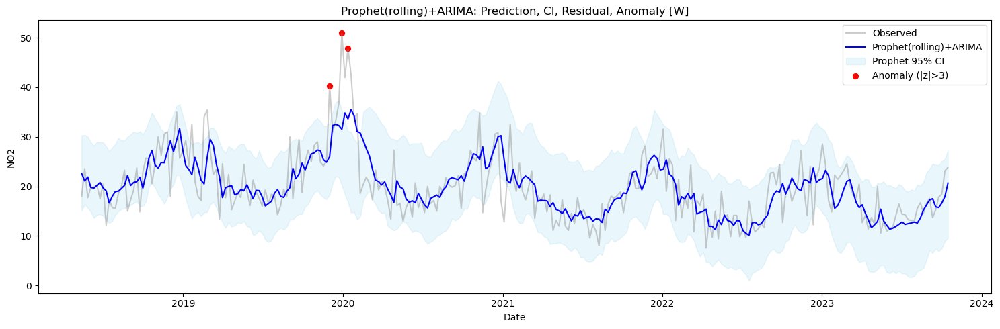

00:15:37 - cmdstanpy - INFO - Chain [1] start processing
00:15:37 - cmdstanpy - INFO - Chain [1] done processing
00:15:37 - cmdstanpy - INFO - Chain [1] start processing
00:15:37 - cmdstanpy - INFO - Chain [1] done processing
00:15:38 - cmdstanpy - INFO - Chain [1] start processing
00:15:38 - cmdstanpy - INFO - Chain [1] done processing
00:15:38 - cmdstanpy - INFO - Chain [1] start processing
00:15:38 - cmdstanpy - INFO - Chain [1] done processing
00:15:38 - cmdstanpy - INFO - Chain [1] start processing
00:15:38 - cmdstanpy - INFO - Chain [1] done processing
00:15:39 - cmdstanpy - INFO - Chain [1] start processing
00:15:39 - cmdstanpy - INFO - Chain [1] done processing
00:15:39 - cmdstanpy - INFO - Chain [1] start processing
00:15:39 - cmdstanpy - INFO - Chain [1] done processing
00:15:39 - cmdstanpy - INFO - Chain [1] start processing
00:15:40 - cmdstanpy - INFO - Chain [1] done processing
00:15:40 - cmdstanpy - INFO - Chain [1] start processing
00:15:40 - cmdstanpy - INFO - Chain [1]

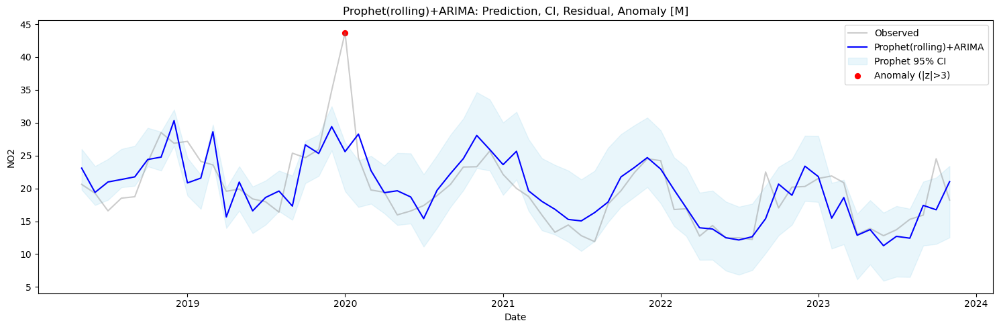

In [12]:
daily_result_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(btu_df, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

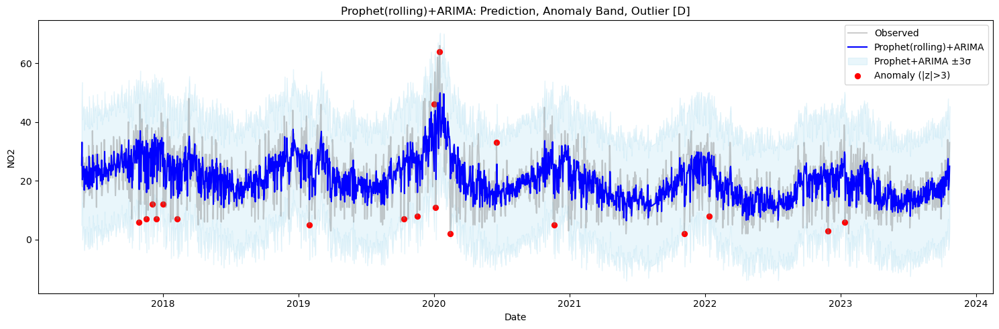

In [13]:
plot_arima_anomaly_band(daily_result_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')

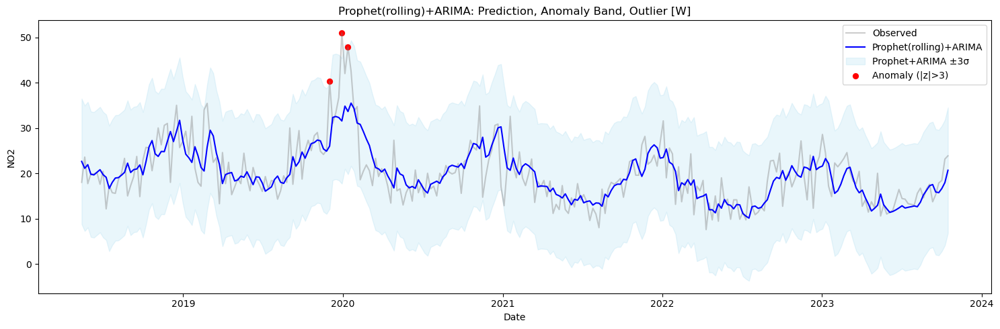

In [14]:
plot_arima_anomaly_band(weekly_result_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')

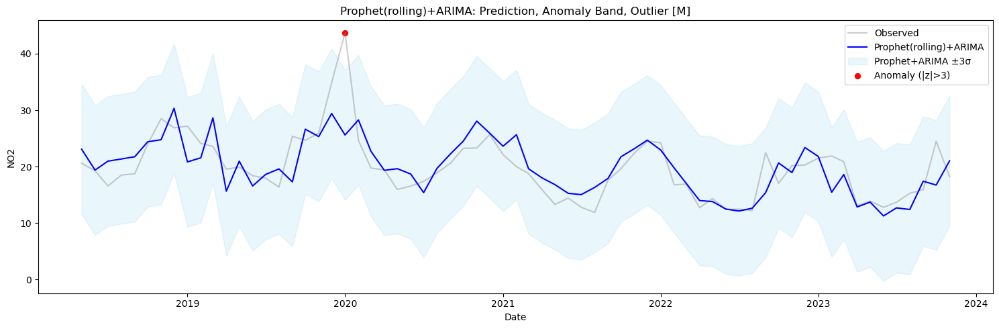

In [15]:
plot_arima_anomaly_band(monthly_result_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

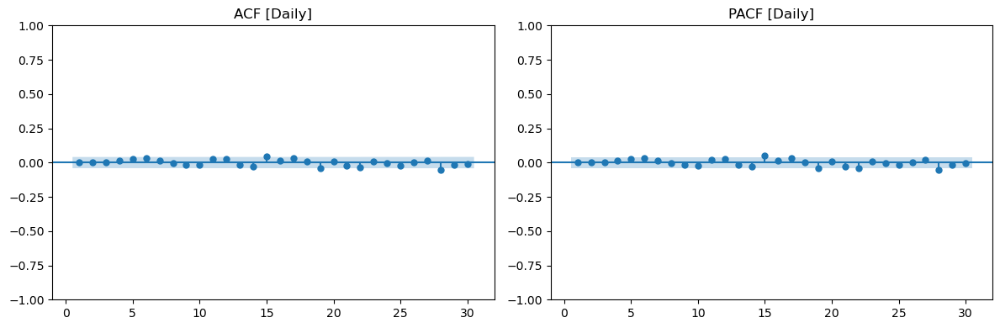

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   5.911570   0.822637
20  22.826321   0.297403
30  37.636233   0.159314



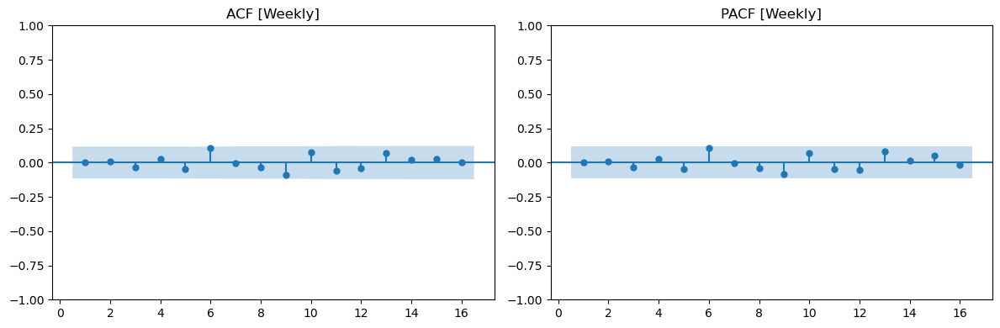

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    5.116796   0.745023
12  10.758503   0.549721
16  12.609839   0.701042



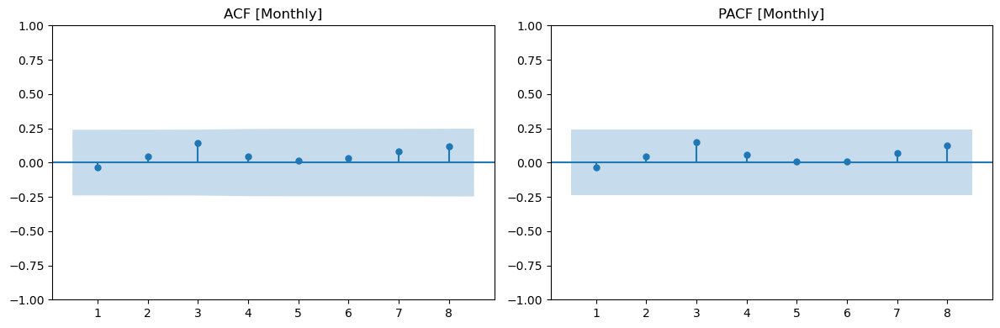

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.887022   0.756529
8  3.629005   0.888950



In [16]:
# Daily residual
residual_diagnostics(daily_result_acicn, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_acicn, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_acicn, lags=[4,8], title='[Monthly]')

# Ganzhou

In [17]:
gzu_df_NASA = pd.read_csv("data/nasa_data/ganzhouNO2.csv")
gzu_df_NASA = cleaning_NASA_data(gzu_df_NASA, 'NO2')
gzu_df_AQICN = pd.read_csv('data/aqicn/ganzhou.csv')
gzu_df_AQICN = change_df(gzu_df_AQICN)

00:16:04 - cmdstanpy - INFO - Chain [1] start processing
00:16:04 - cmdstanpy - INFO - Chain [1] done processing
00:16:04 - cmdstanpy - INFO - Chain [1] start processing
00:16:04 - cmdstanpy - INFO - Chain [1] done processing
00:16:04 - cmdstanpy - INFO - Chain [1] start processing
00:16:05 - cmdstanpy - INFO - Chain [1] done processing
00:16:05 - cmdstanpy - INFO - Chain [1] start processing
00:16:05 - cmdstanpy - INFO - Chain [1] done processing
00:16:05 - cmdstanpy - INFO - Chain [1] start processing
00:16:05 - cmdstanpy - INFO - Chain [1] done processing
00:16:05 - cmdstanpy - INFO - Chain [1] start processing
00:16:05 - cmdstanpy - INFO - Chain [1] done processing
00:16:05 - cmdstanpy - INFO - Chain [1] start processing
00:16:05 - cmdstanpy - INFO - Chain [1] done processing
00:16:06 - cmdstanpy - INFO - Chain [1] start processing
00:16:06 - cmdstanpy - INFO - Chain [1] done processing
00:16:06 - cmdstanpy - INFO - Chain [1] start processing
00:16:06 - cmdstanpy - INFO - Chain [1]

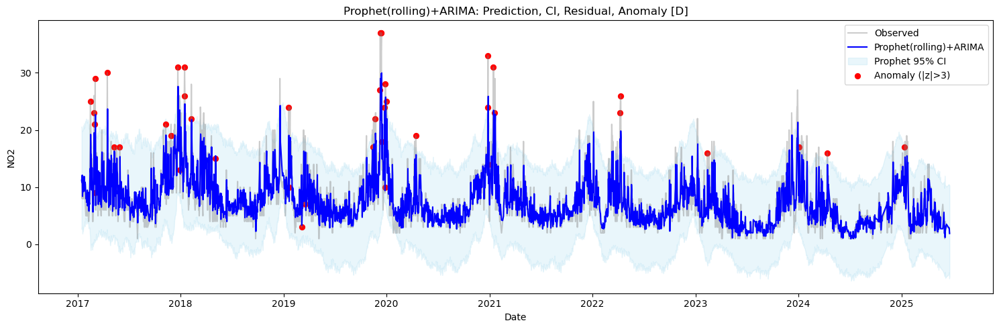

00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:51 - cmdstanpy - INFO - Chain [1] start processing
00:16:51 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1] done processing
00:16:52 - cmdstanpy - INFO - Chain [1] start processing
00:16:52 - cmdstanpy - INFO - Chain [1]

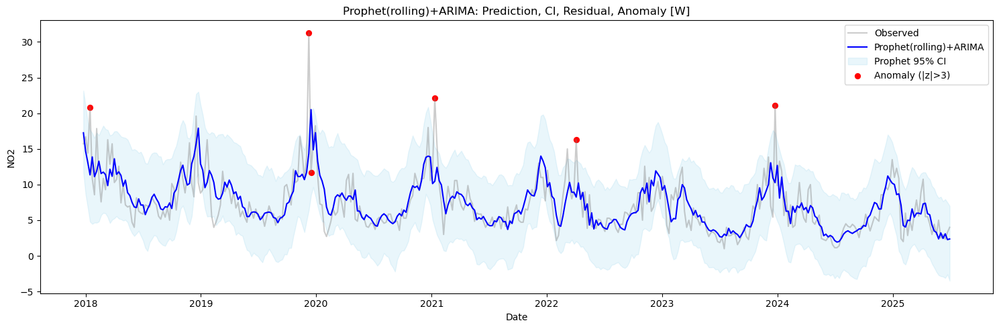

00:17:10 - cmdstanpy - INFO - Chain [1] start processing
00:17:10 - cmdstanpy - INFO - Chain [1] done processing
00:17:10 - cmdstanpy - INFO - Chain [1] start processing
00:17:10 - cmdstanpy - INFO - Chain [1] done processing
00:17:10 - cmdstanpy - INFO - Chain [1] start processing
00:17:10 - cmdstanpy - INFO - Chain [1] done processing
00:17:11 - cmdstanpy - INFO - Chain [1] start processing
00:17:11 - cmdstanpy - INFO - Chain [1] done processing
00:17:11 - cmdstanpy - INFO - Chain [1] start processing
00:17:11 - cmdstanpy - INFO - Chain [1] done processing
00:17:11 - cmdstanpy - INFO - Chain [1] start processing
00:17:11 - cmdstanpy - INFO - Chain [1] done processing
00:17:11 - cmdstanpy - INFO - Chain [1] start processing
00:17:12 - cmdstanpy - INFO - Chain [1] done processing
00:17:12 - cmdstanpy - INFO - Chain [1] start processing
00:17:12 - cmdstanpy - INFO - Chain [1] done processing
00:17:12 - cmdstanpy - INFO - Chain [1] start processing
00:17:12 - cmdstanpy - INFO - Chain [1]

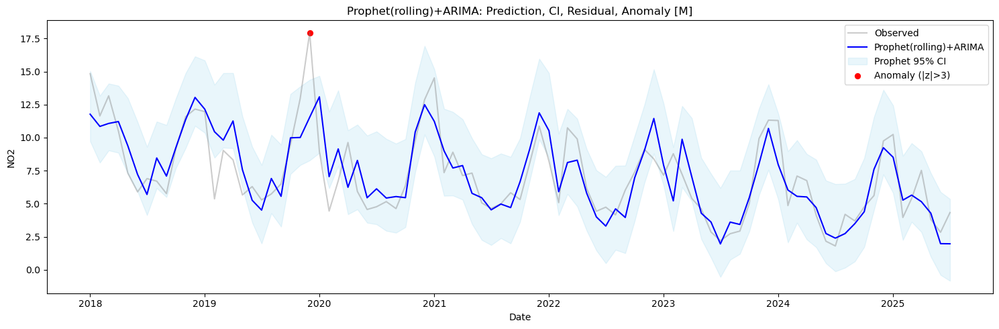

In [18]:
daily_result_gzu_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_AQICN, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_gzu_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_AQICN, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_gzu_acicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_AQICN, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

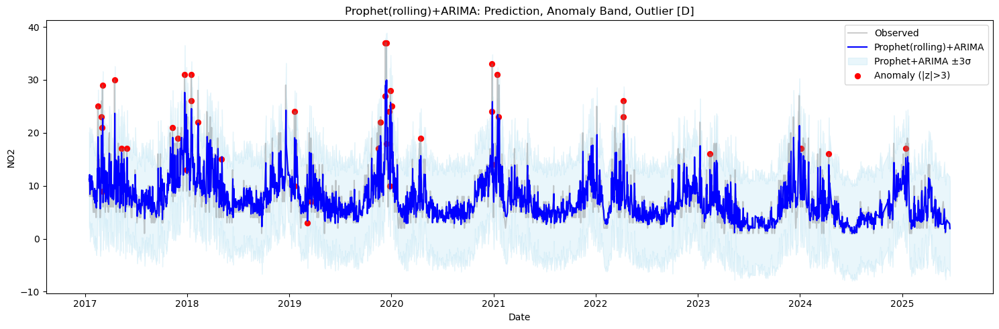

In [19]:
plot_arima_anomaly_band(daily_result_gzu_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')

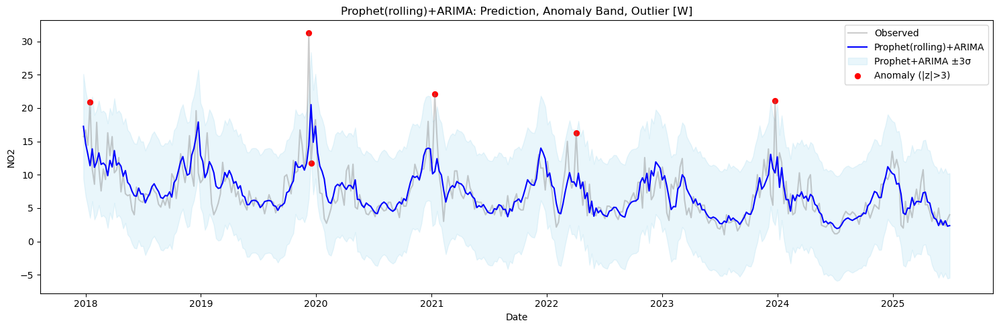

In [20]:
plot_arima_anomaly_band(weekly_result_gzu_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')

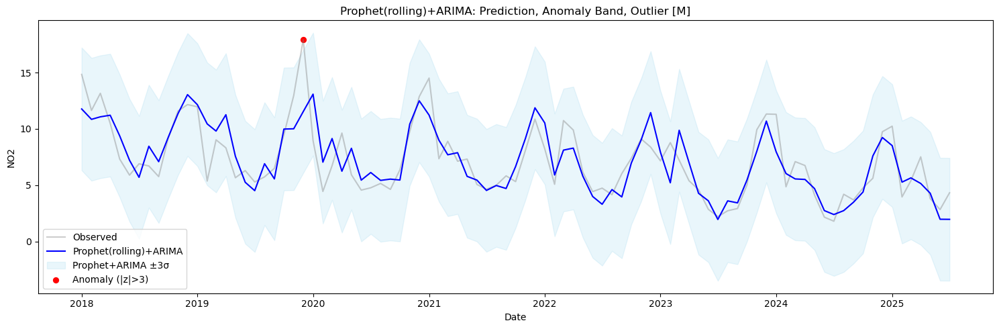

In [21]:
plot_arima_anomaly_band(monthly_result_gzu_acicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

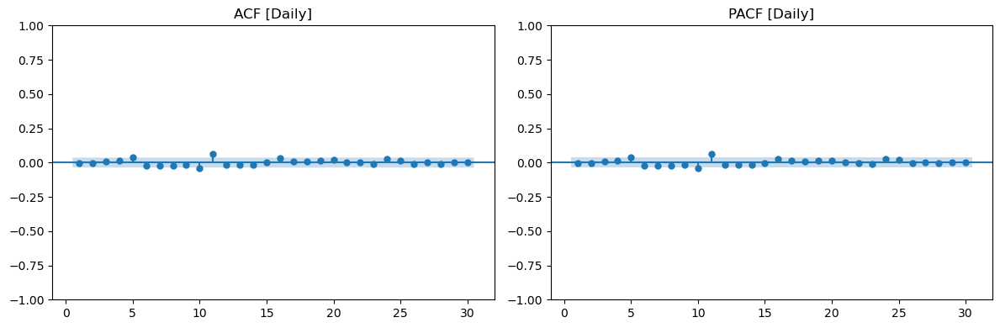

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  15.245108   0.123378
20  34.058388   0.025732
30  37.774792   0.155618



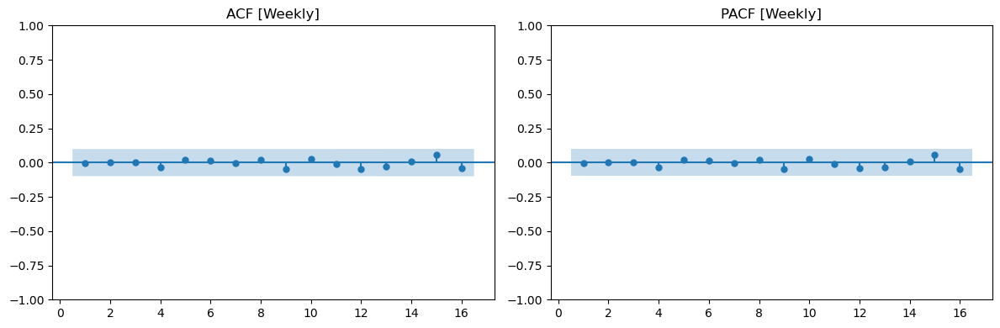

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   0.956958   0.998506
12  2.993277   0.995591
16  5.334308   0.993825



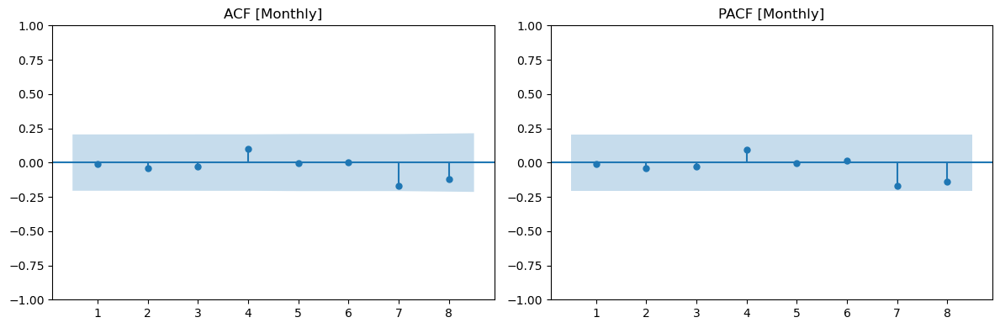

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.181991   0.881055
8  5.733850   0.677016



In [22]:
# Daily residual
residual_diagnostics(daily_result_gzu_acicn, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_gzu_acicn, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_gzu_acicn, lags=[4,8], title='[Monthly]')

00:17:37 - cmdstanpy - INFO - Chain [1] start processing
00:17:37 - cmdstanpy - INFO - Chain [1] done processing
00:17:37 - cmdstanpy - INFO - Chain [1] start processing
00:17:38 - cmdstanpy - INFO - Chain [1] done processing
00:17:38 - cmdstanpy - INFO - Chain [1] start processing
00:17:38 - cmdstanpy - INFO - Chain [1] done processing
00:17:38 - cmdstanpy - INFO - Chain [1] start processing
00:17:38 - cmdstanpy - INFO - Chain [1] done processing
00:17:38 - cmdstanpy - INFO - Chain [1] start processing
00:17:38 - cmdstanpy - INFO - Chain [1] done processing
00:17:38 - cmdstanpy - INFO - Chain [1] start processing
00:17:38 - cmdstanpy - INFO - Chain [1] done processing
00:17:39 - cmdstanpy - INFO - Chain [1] start processing
00:17:39 - cmdstanpy - INFO - Chain [1] done processing
00:17:39 - cmdstanpy - INFO - Chain [1] start processing
00:17:39 - cmdstanpy - INFO - Chain [1] done processing
00:17:39 - cmdstanpy - INFO - Chain [1] start processing
00:17:39 - cmdstanpy - INFO - Chain [1]

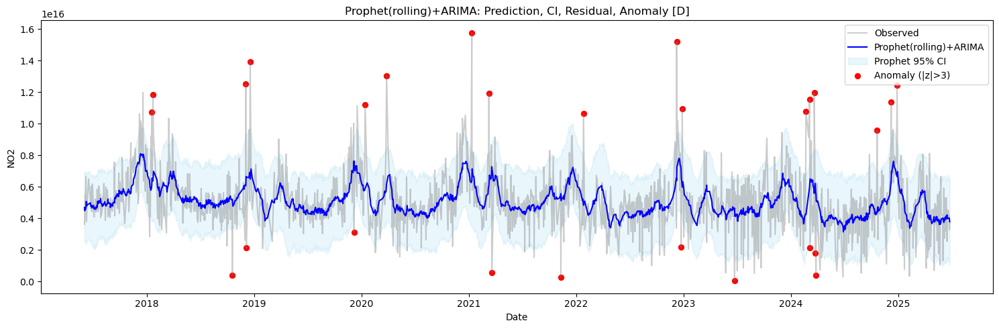

00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:56 - cmdstanpy - INFO - Chain [1] start processing
00:17:56 - cmdstanpy - INFO - Chain [1] done processing
00:17:57 - cmdstanpy - INFO - Chain [1] start processing
00:17:57 - cmdstanpy - INFO - Chain [1] done processing
00:17:57 - cmdstanpy - INFO - Chain [1] start processing
00:17:57 - cmdstanpy - INFO - Chain [1] done processing
00:17:57 - cmdstanpy - INFO - Chain [1] start processing
00:17:57 - cmdstanpy - INFO - Chain [1]

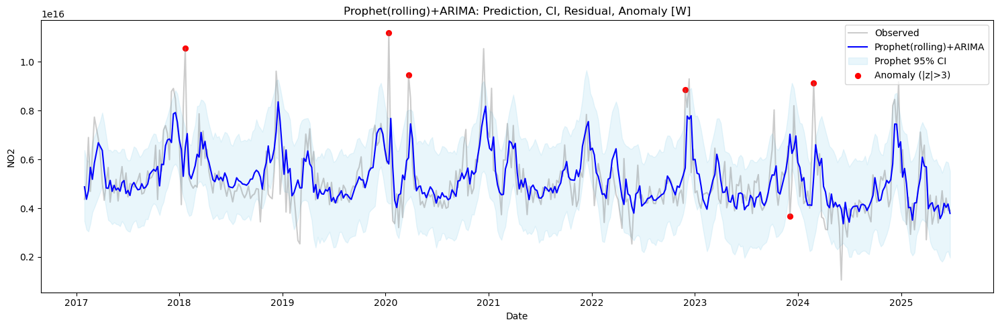

00:18:16 - cmdstanpy - INFO - Chain [1] start processing
00:18:16 - cmdstanpy - INFO - Chain [1] done processing
00:18:16 - cmdstanpy - INFO - Chain [1] start processing
00:18:17 - cmdstanpy - INFO - Chain [1] done processing
00:18:17 - cmdstanpy - INFO - Chain [1] start processing
00:18:17 - cmdstanpy - INFO - Chain [1] done processing
00:18:17 - cmdstanpy - INFO - Chain [1] start processing
00:18:17 - cmdstanpy - INFO - Chain [1] done processing
00:18:17 - cmdstanpy - INFO - Chain [1] start processing
00:18:18 - cmdstanpy - INFO - Chain [1] done processing
00:18:18 - cmdstanpy - INFO - Chain [1] start processing
00:18:18 - cmdstanpy - INFO - Chain [1] done processing
00:18:18 - cmdstanpy - INFO - Chain [1] start processing
00:18:18 - cmdstanpy - INFO - Chain [1] done processing
00:18:18 - cmdstanpy - INFO - Chain [1] start processing
00:18:19 - cmdstanpy - INFO - Chain [1] done processing
00:18:19 - cmdstanpy - INFO - Chain [1] start processing
00:18:19 - cmdstanpy - INFO - Chain [1]

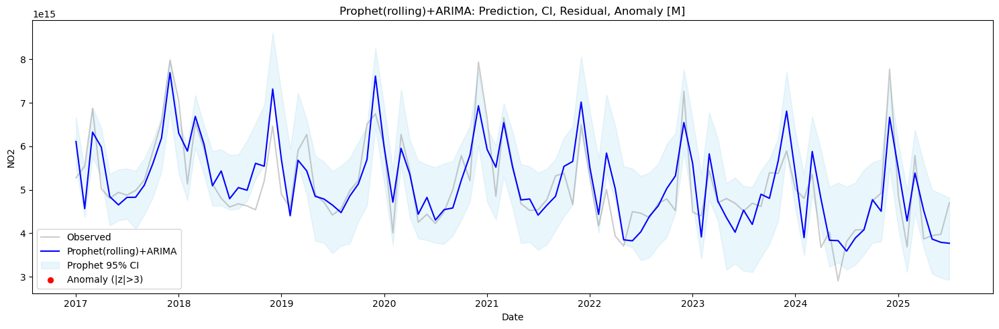

In [23]:
daily_result_gzu_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_gzu_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_gzu_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(gzu_df_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

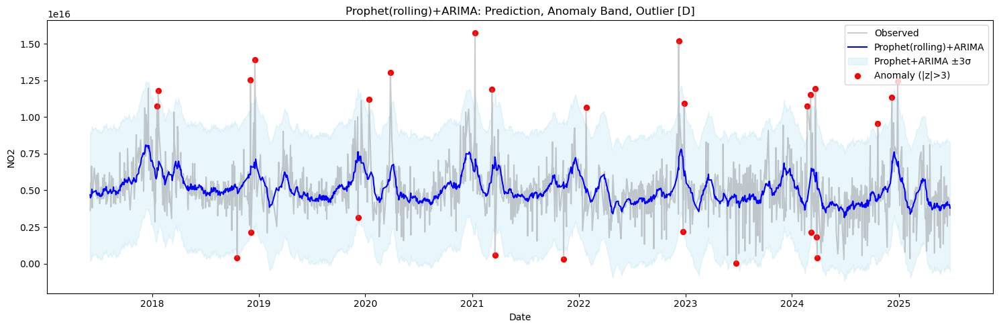

In [24]:
plot_arima_anomaly_band(daily_result_gzu_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')

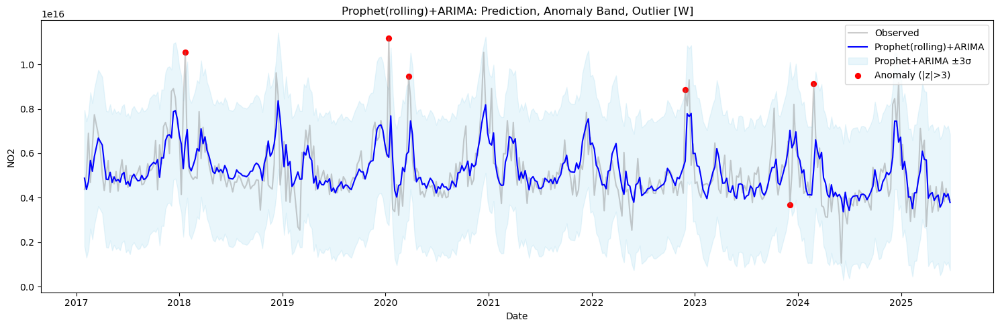

In [25]:
plot_arima_anomaly_band(weekly_result_gzu_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')

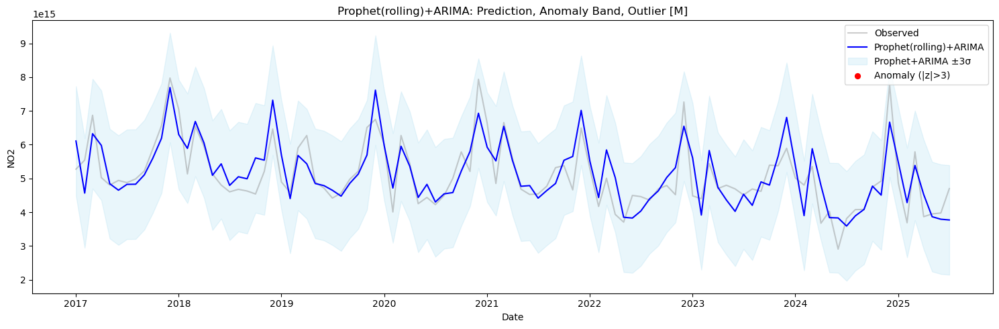

In [26]:
plot_arima_anomaly_band(monthly_result_gzu_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

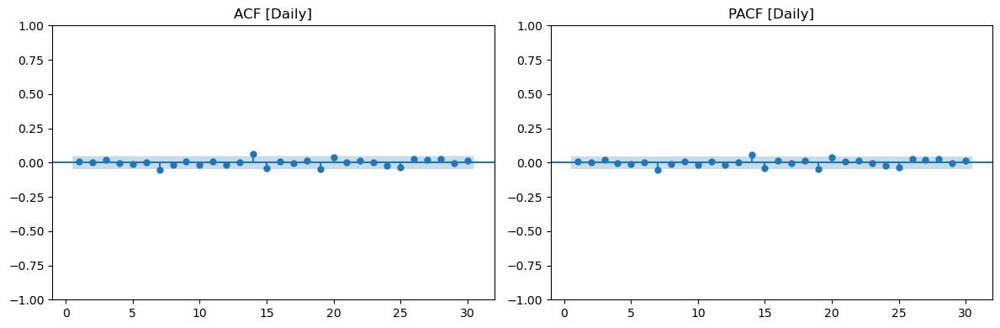

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   6.842200   0.740254
20  23.129188   0.282496
30  29.488017   0.492083



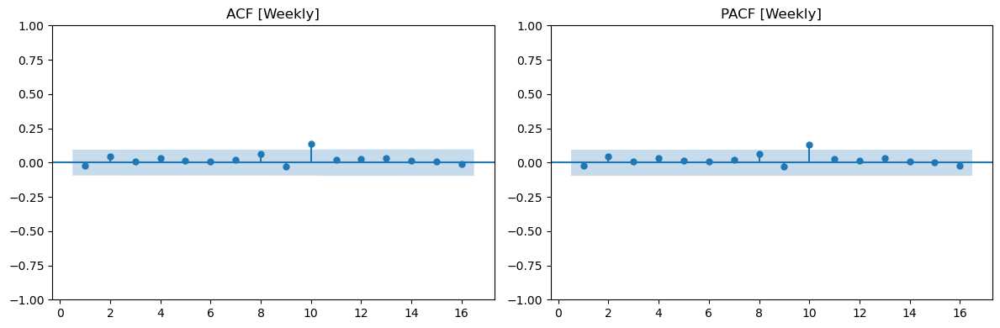

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    3.667915   0.885774
12  12.783616   0.384963
16  13.501992   0.635760



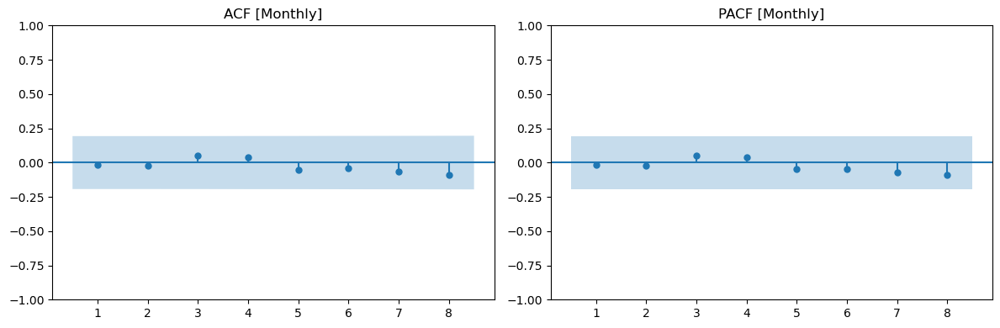

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.516613   0.971864
8  2.413081   0.965661



In [27]:
# Daily residual
residual_diagnostics(daily_result_gzu_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_gzu_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_gzu_nasa, lags=[4,8], title='[Monthly]')

# Kunming

In [28]:
kmg_df_NASA = pd.read_csv("data/nasa_data/kunmingNO2.csv")
kmg_df_NASA = cleaning_NASA_data(kmg_df_NASA, 'NO2')
kmg_df_AQICN = pd.read_csv('data/aqicn/kunming.csv')
kmg_df_AQICN = change_df(kmg_df_AQICN)

00:18:48 - cmdstanpy - INFO - Chain [1] start processing
00:18:48 - cmdstanpy - INFO - Chain [1] done processing
00:18:48 - cmdstanpy - INFO - Chain [1] start processing
00:18:48 - cmdstanpy - INFO - Chain [1] done processing
00:18:48 - cmdstanpy - INFO - Chain [1] start processing
00:18:48 - cmdstanpy - INFO - Chain [1] done processing
00:18:49 - cmdstanpy - INFO - Chain [1] start processing
00:18:49 - cmdstanpy - INFO - Chain [1] done processing
00:18:49 - cmdstanpy - INFO - Chain [1] start processing
00:18:49 - cmdstanpy - INFO - Chain [1] done processing
00:18:49 - cmdstanpy - INFO - Chain [1] start processing
00:18:49 - cmdstanpy - INFO - Chain [1] done processing
00:18:49 - cmdstanpy - INFO - Chain [1] start processing
00:18:49 - cmdstanpy - INFO - Chain [1] done processing
00:18:50 - cmdstanpy - INFO - Chain [1] start processing
00:18:50 - cmdstanpy - INFO - Chain [1] done processing
00:18:50 - cmdstanpy - INFO - Chain [1] start processing
00:18:50 - cmdstanpy - INFO - Chain [1]

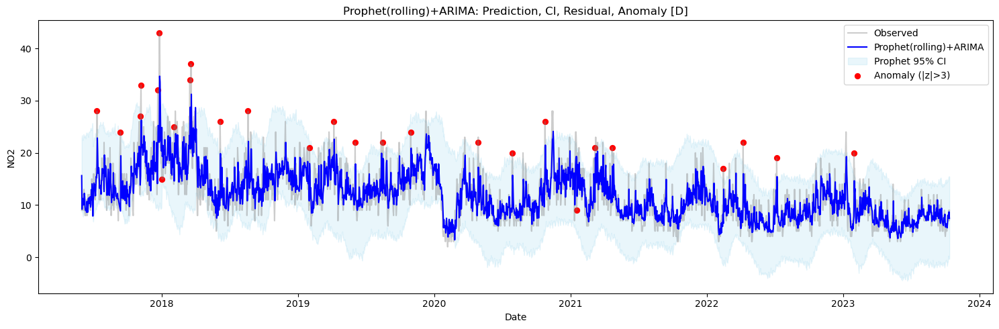

00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:47 - cmdstanpy - INFO - Chain [1] done processing
00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:47 - cmdstanpy - INFO - Chain [1] done processing
00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:47 - cmdstanpy - INFO - Chain [1] done processing
00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:47 - cmdstanpy - INFO - Chain [1] done processing
00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:47 - cmdstanpy - INFO - Chain [1] done processing
00:19:47 - cmdstanpy - INFO - Chain [1] start processing
00:19:48 - cmdstanpy - INFO - Chain [1] done processing
00:19:48 - cmdstanpy - INFO - Chain [1] start processing
00:19:48 - cmdstanpy - INFO - Chain [1] done processing
00:19:48 - cmdstanpy - INFO - Chain [1] start processing
00:19:48 - cmdstanpy - INFO - Chain [1] done processing
00:19:48 - cmdstanpy - INFO - Chain [1] start processing
00:19:48 - cmdstanpy - INFO - Chain [1]

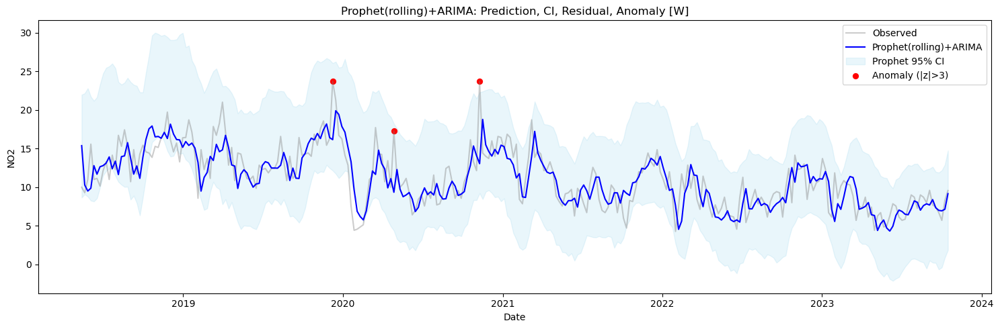

00:20:02 - cmdstanpy - INFO - Chain [1] start processing
00:20:03 - cmdstanpy - INFO - Chain [1] done processing
00:20:03 - cmdstanpy - INFO - Chain [1] start processing
00:20:03 - cmdstanpy - INFO - Chain [1] done processing
00:20:03 - cmdstanpy - INFO - Chain [1] start processing
00:20:03 - cmdstanpy - INFO - Chain [1] done processing
00:20:03 - cmdstanpy - INFO - Chain [1] start processing
00:20:03 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:04 - cmdstanpy - INFO - Chain [1] done processing
00:20:05 - cmdstanpy - INFO - Chain [1] start processing
00:20:05 - cmdstanpy - INFO - Chain [1]

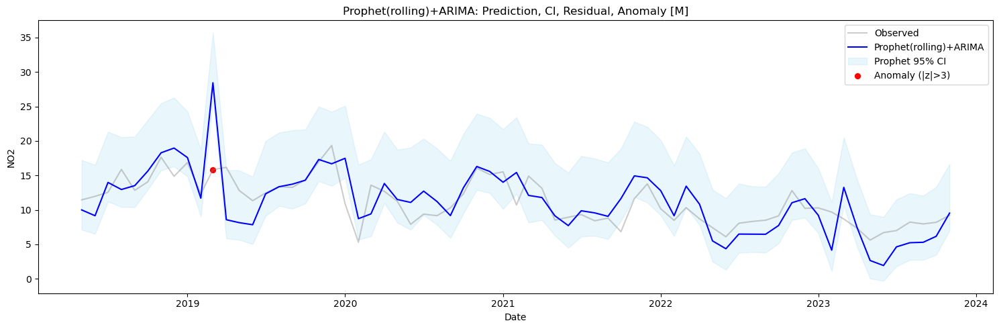

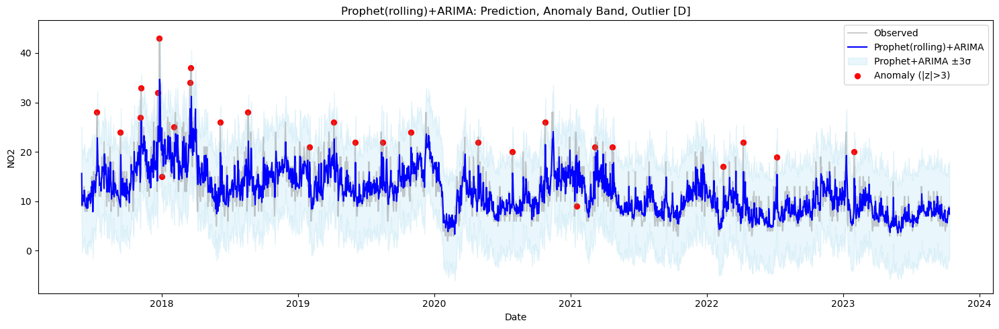

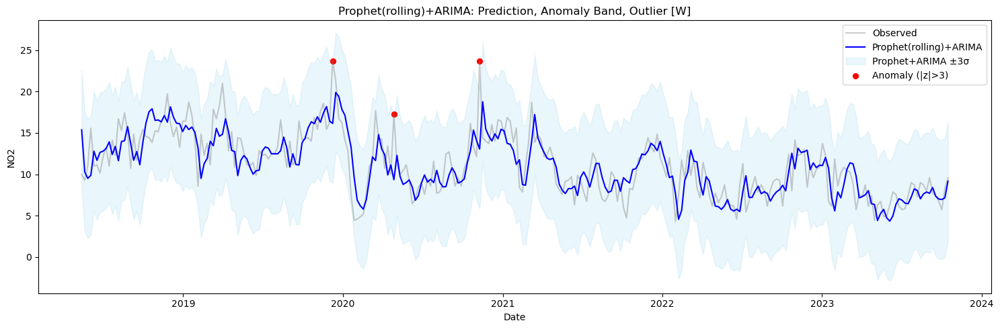

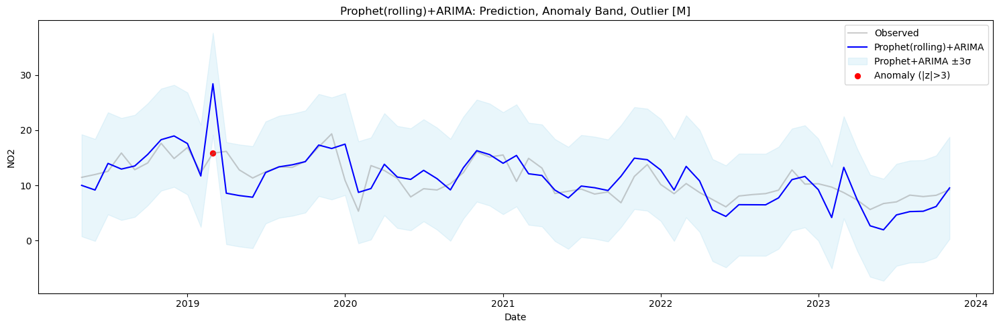

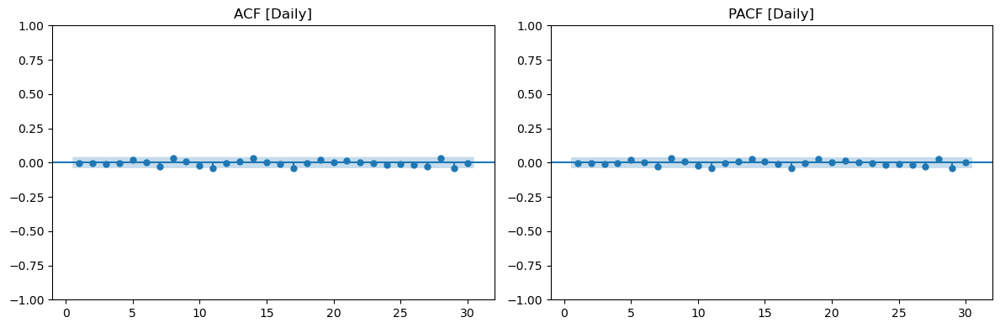

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   7.270676   0.699668
20  18.835516   0.532540
30  29.413232   0.495975



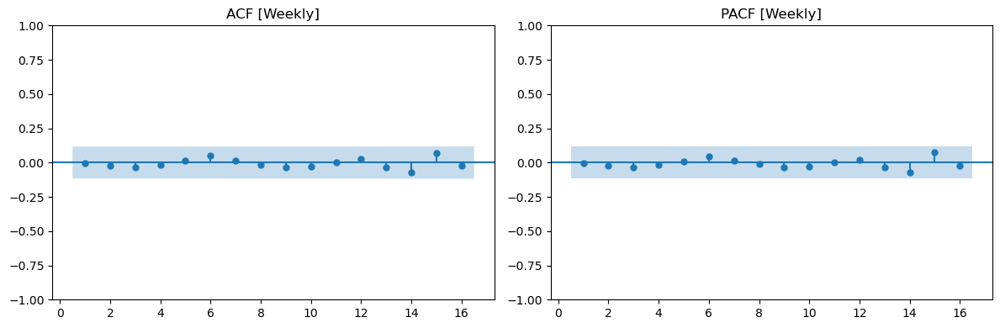

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   1.465183   0.993271
12  2.380087   0.998561
16  6.005098   0.988040



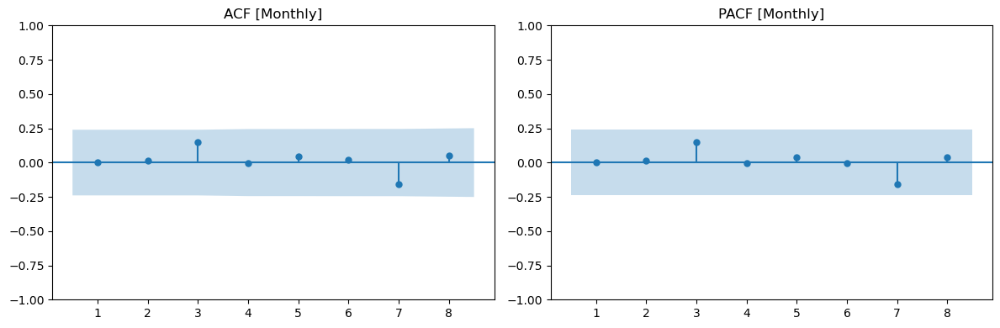

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.603838   0.808102
8  3.883551   0.867474



In [29]:
daily_result_kmg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_AQICN, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_kmg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_AQICN, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_kmg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_AQICN, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_kmg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_kmg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_kmg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_kmg_aqicn, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_kmg_aqicn, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_kmg_aqicn, lags=[4,8], title='[Monthly]')

00:20:27 - cmdstanpy - INFO - Chain [1] start processing
00:20:27 - cmdstanpy - INFO - Chain [1] done processing
00:20:27 - cmdstanpy - INFO - Chain [1] start processing
00:20:27 - cmdstanpy - INFO - Chain [1] done processing
00:20:27 - cmdstanpy - INFO - Chain [1] start processing
00:20:27 - cmdstanpy - INFO - Chain [1] done processing
00:20:27 - cmdstanpy - INFO - Chain [1] start processing
00:20:27 - cmdstanpy - INFO - Chain [1] done processing
00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:28 - cmdstanpy - INFO - Chain [1] done processing
00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:28 - cmdstanpy - INFO - Chain [1] done processing
00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:28 - cmdstanpy - INFO - Chain [1] done processing
00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:28 - cmdstanpy - INFO - Chain [1] done processing
00:20:28 - cmdstanpy - INFO - Chain [1] start processing
00:20:29 - cmdstanpy - INFO - Chain [1]

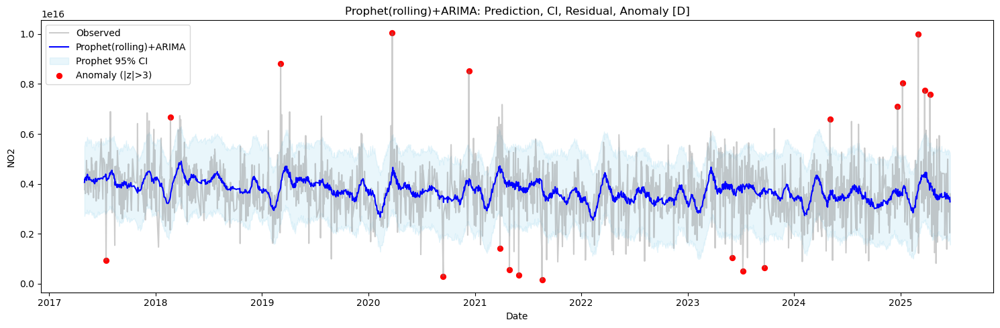

00:20:48 - cmdstanpy - INFO - Chain [1] start processing
00:20:48 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:49 - cmdstanpy - INFO - Chain [1] start processing
00:20:49 - cmdstanpy - INFO - Chain [1] done processing
00:20:50 - cmdstanpy - INFO - Chain [1] start processing
00:20:50 - cmdstanpy - INFO - Chain [1] done processing
00:20:50 - cmdstanpy - INFO - Chain [1] start processing
00:20:50 - cmdstanpy - INFO - Chain [1]

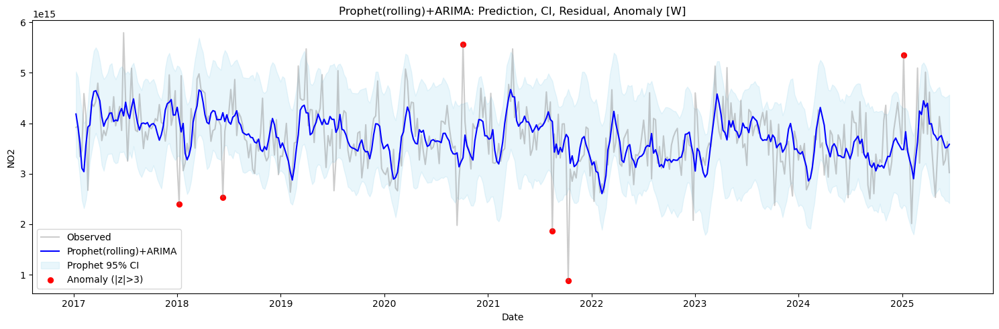

00:21:12 - cmdstanpy - INFO - Chain [1] start processing
00:21:12 - cmdstanpy - INFO - Chain [1] done processing
00:21:12 - cmdstanpy - INFO - Chain [1] start processing
00:21:12 - cmdstanpy - INFO - Chain [1] done processing
00:21:12 - cmdstanpy - INFO - Chain [1] start processing
00:21:13 - cmdstanpy - INFO - Chain [1] done processing
00:21:13 - cmdstanpy - INFO - Chain [1] start processing
00:21:13 - cmdstanpy - INFO - Chain [1] done processing
00:21:13 - cmdstanpy - INFO - Chain [1] start processing
00:21:13 - cmdstanpy - INFO - Chain [1] done processing
00:21:13 - cmdstanpy - INFO - Chain [1] start processing
00:21:14 - cmdstanpy - INFO - Chain [1] done processing
00:21:14 - cmdstanpy - INFO - Chain [1] start processing
00:21:14 - cmdstanpy - INFO - Chain [1] done processing
00:21:14 - cmdstanpy - INFO - Chain [1] start processing
00:21:14 - cmdstanpy - INFO - Chain [1] done processing
00:21:14 - cmdstanpy - INFO - Chain [1] start processing
00:21:15 - cmdstanpy - INFO - Chain [1]

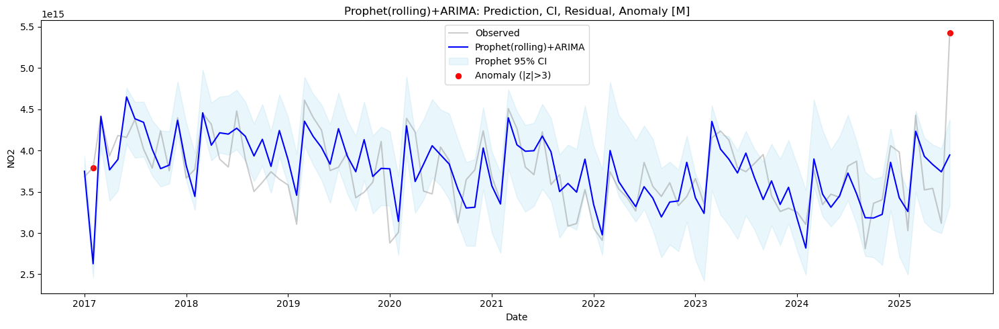

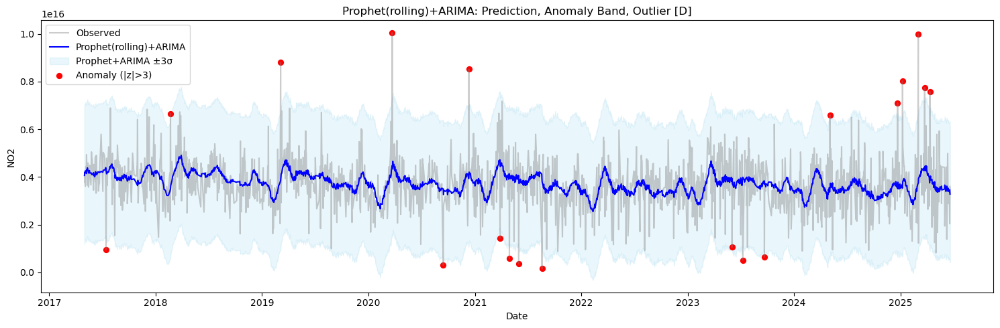

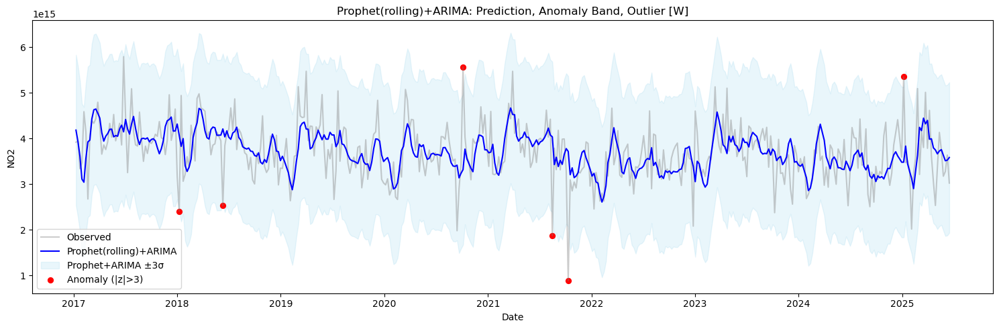

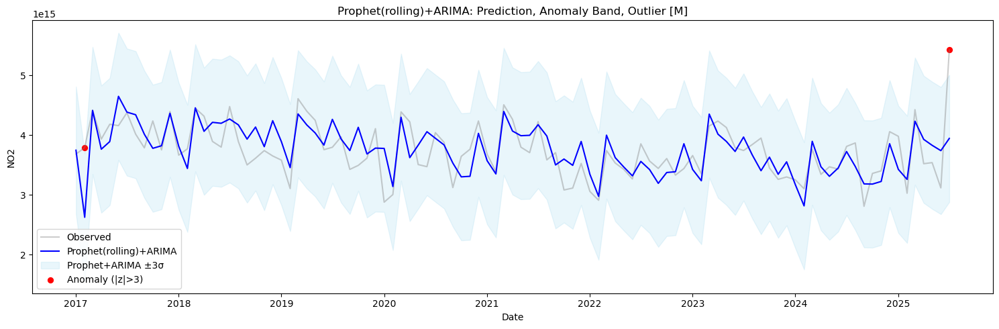

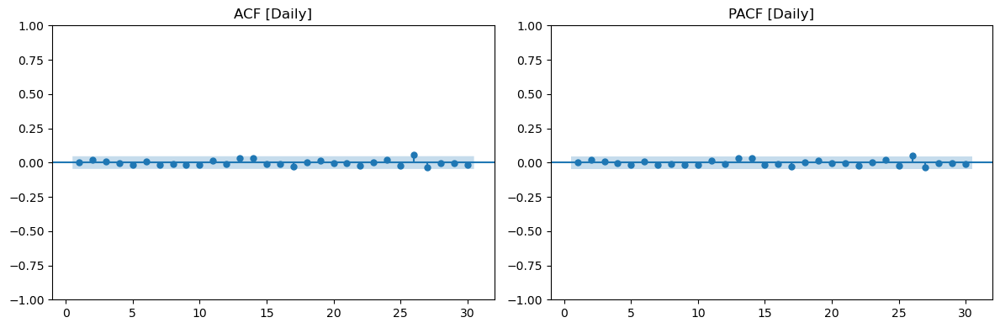

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   3.360685   0.971618
20  10.503462   0.958098
30  21.105764   0.884552



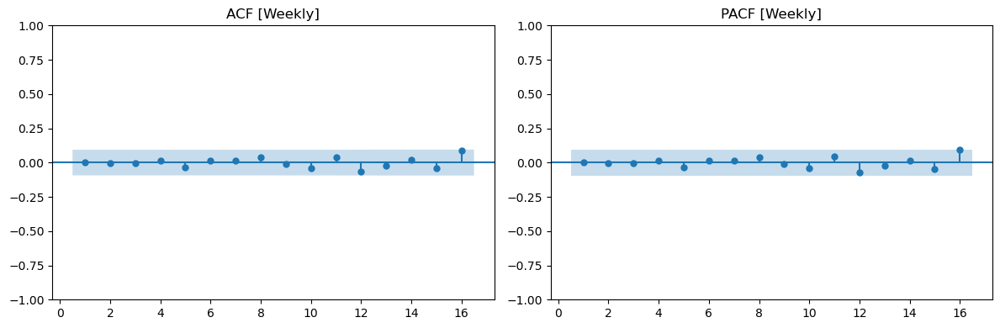

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   1.495491   0.992782
12  5.181683   0.951633
16  9.888992   0.872361



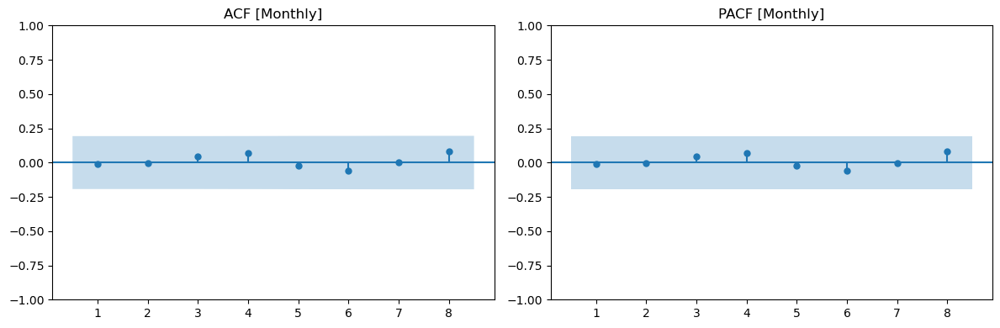

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.719757    0.94887
8  1.941970    0.98274



In [30]:
daily_result_kmg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_kmg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_kmg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(kmg_df_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_kmg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_kmg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_kmg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_kmg_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_kmg_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_kmg_nasa, lags=[4,8], title='[Monthly]')

# Shanghai

In [31]:
shi_df_NASA = pd.read_csv("data/nasa_data/shanghaiNO2.csv")
shi_df_NASA = cleaning_NASA_data(shi_df_NASA, 'NO2')
shi_df_AQICN = pd.read_csv('data/aqicn/shanghai.csv')
shi_df_AQICN = change_df(shi_df_AQICN)

00:21:47 - cmdstanpy - INFO - Chain [1] start processing
00:21:47 - cmdstanpy - INFO - Chain [1] done processing
00:21:47 - cmdstanpy - INFO - Chain [1] start processing
00:21:47 - cmdstanpy - INFO - Chain [1] done processing
00:21:47 - cmdstanpy - INFO - Chain [1] start processing
00:21:47 - cmdstanpy - INFO - Chain [1] done processing
00:21:47 - cmdstanpy - INFO - Chain [1] start processing
00:21:47 - cmdstanpy - INFO - Chain [1] done processing
00:21:48 - cmdstanpy - INFO - Chain [1] start processing
00:21:48 - cmdstanpy - INFO - Chain [1] done processing
00:21:48 - cmdstanpy - INFO - Chain [1] start processing
00:21:48 - cmdstanpy - INFO - Chain [1] done processing
00:21:48 - cmdstanpy - INFO - Chain [1] start processing
00:21:48 - cmdstanpy - INFO - Chain [1] done processing
00:21:48 - cmdstanpy - INFO - Chain [1] start processing
00:21:48 - cmdstanpy - INFO - Chain [1] done processing
00:21:49 - cmdstanpy - INFO - Chain [1] start processing
00:21:49 - cmdstanpy - INFO - Chain [1]

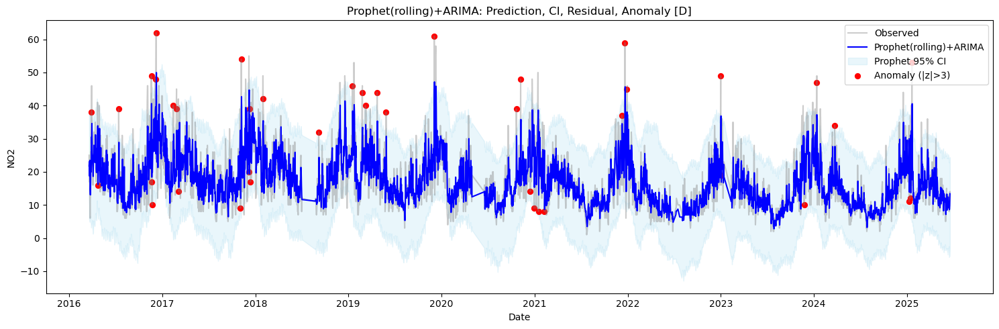

00:22:35 - cmdstanpy - INFO - Chain [1] start processing
00:22:35 - cmdstanpy - INFO - Chain [1] done processing
00:22:36 - cmdstanpy - INFO - Chain [1] start processing
00:22:36 - cmdstanpy - INFO - Chain [1] done processing
00:22:36 - cmdstanpy - INFO - Chain [1] start processing
00:22:36 - cmdstanpy - INFO - Chain [1] done processing
00:22:36 - cmdstanpy - INFO - Chain [1] start processing
00:22:36 - cmdstanpy - INFO - Chain [1] done processing
00:22:36 - cmdstanpy - INFO - Chain [1] start processing
00:22:36 - cmdstanpy - INFO - Chain [1] done processing
00:22:36 - cmdstanpy - INFO - Chain [1] start processing
00:22:36 - cmdstanpy - INFO - Chain [1] done processing
00:22:37 - cmdstanpy - INFO - Chain [1] start processing
00:22:37 - cmdstanpy - INFO - Chain [1] done processing
00:22:37 - cmdstanpy - INFO - Chain [1] start processing
00:22:37 - cmdstanpy - INFO - Chain [1] done processing
00:22:37 - cmdstanpy - INFO - Chain [1] start processing
00:22:37 - cmdstanpy - INFO - Chain [1]

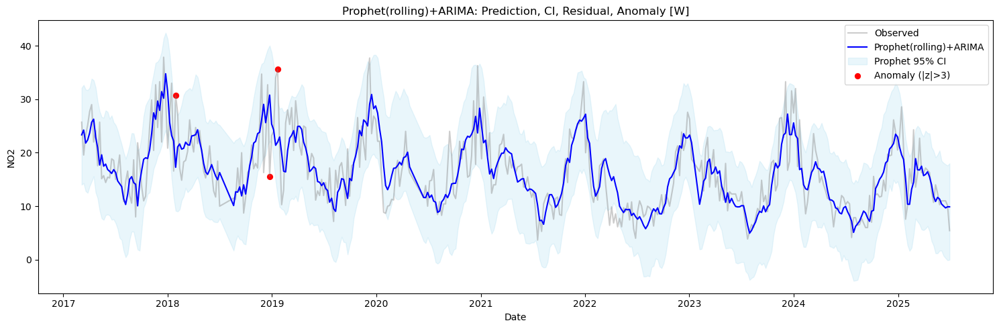

00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:56 - cmdstanpy - INFO - Chain [1] done processing
00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:56 - cmdstanpy - INFO - Chain [1] done processing
00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:56 - cmdstanpy - INFO - Chain [1] done processing
00:22:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:57 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:57 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:57 - cmdstanpy - INFO - Chain [1] start processing
00:22:57 - cmdstanpy - INFO - Chain [1] done processing
00:22:58 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1] done processing
00:22:58 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1]

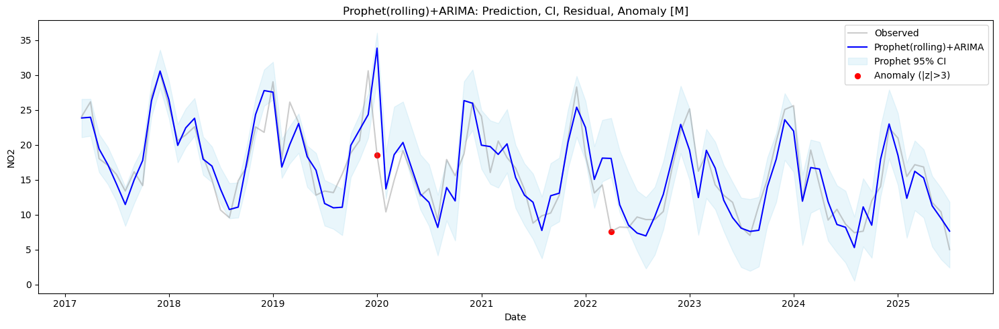

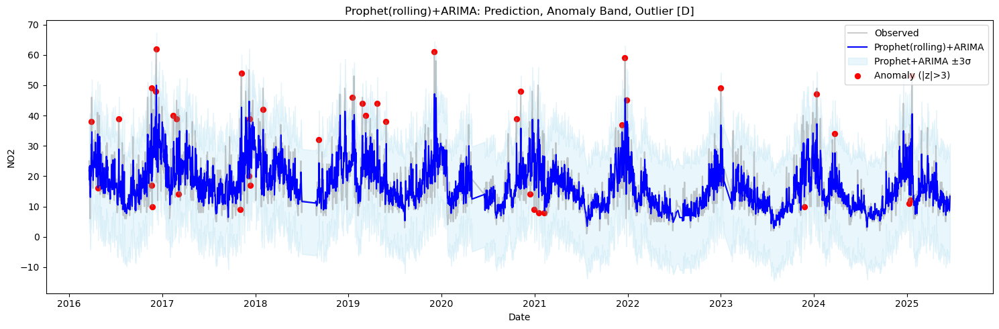

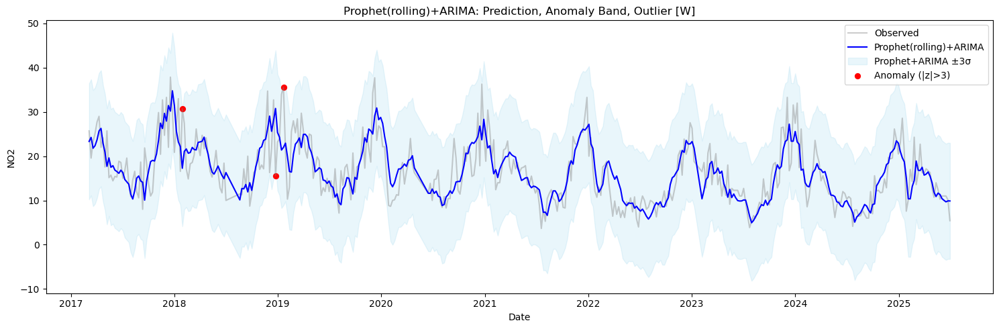

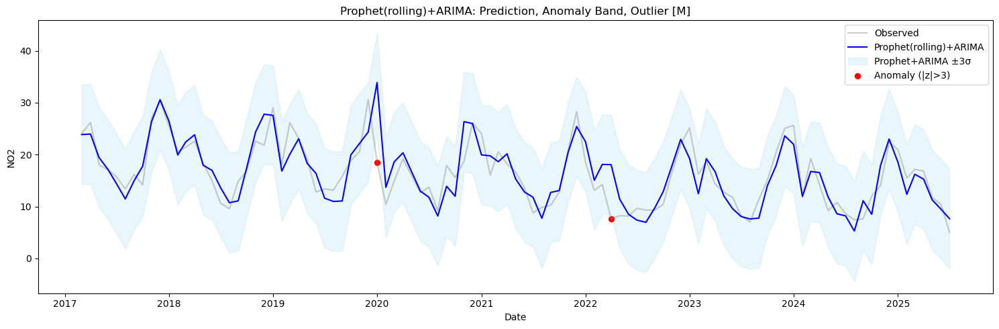

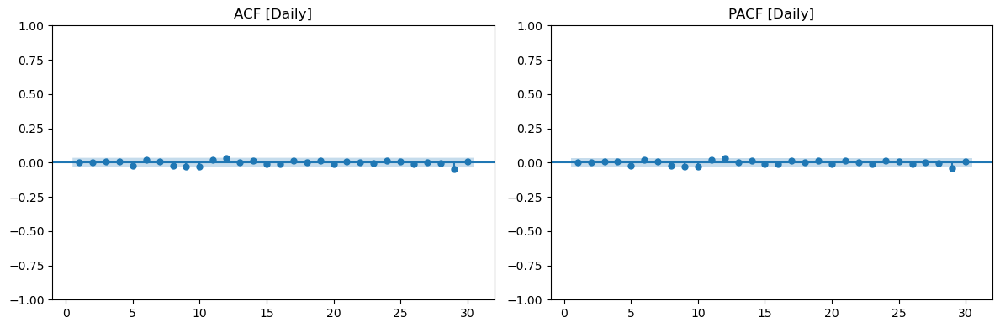

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  10.684073   0.382655
20  17.693119   0.607616
30  26.281503   0.660689



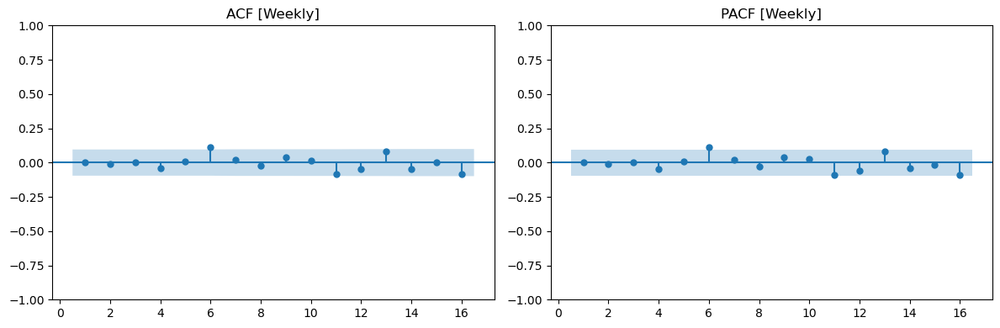

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    6.879095   0.549732
12  11.705338   0.469625
16  18.330447   0.304905



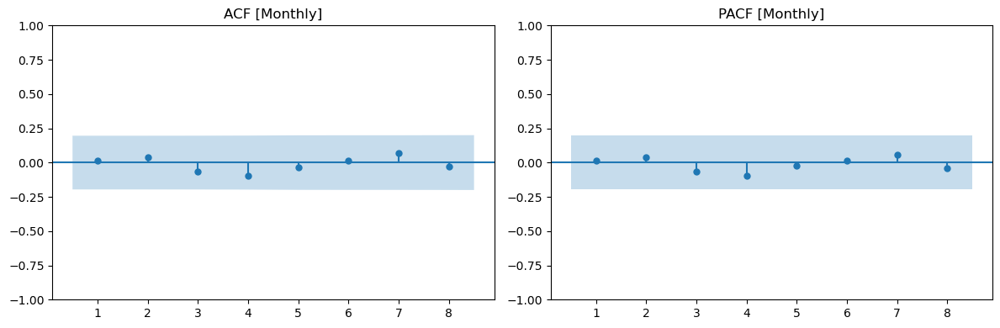

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.632167   0.802999
8  2.337290   0.968887



In [32]:
daily_result_shi_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_AQICN, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_shi_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_AQICN, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_shi_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_AQICN, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_shi_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_shi_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_shi_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_shi_aqicn, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_shi_aqicn, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_shi_aqicn, lags=[4,8], title='[Monthly]')

00:23:26 - cmdstanpy - INFO - Chain [1] start processing
00:23:26 - cmdstanpy - INFO - Chain [1] done processing
00:23:26 - cmdstanpy - INFO - Chain [1] start processing
00:23:26 - cmdstanpy - INFO - Chain [1] done processing
00:23:26 - cmdstanpy - INFO - Chain [1] start processing
00:23:26 - cmdstanpy - INFO - Chain [1] done processing
00:23:27 - cmdstanpy - INFO - Chain [1] start processing
00:23:27 - cmdstanpy - INFO - Chain [1] done processing
00:23:27 - cmdstanpy - INFO - Chain [1] start processing
00:23:27 - cmdstanpy - INFO - Chain [1] done processing
00:23:27 - cmdstanpy - INFO - Chain [1] start processing
00:23:27 - cmdstanpy - INFO - Chain [1] done processing
00:23:27 - cmdstanpy - INFO - Chain [1] start processing
00:23:27 - cmdstanpy - INFO - Chain [1] done processing
00:23:28 - cmdstanpy - INFO - Chain [1] start processing
00:23:28 - cmdstanpy - INFO - Chain [1] done processing
00:23:28 - cmdstanpy - INFO - Chain [1] start processing
00:23:28 - cmdstanpy - INFO - Chain [1]

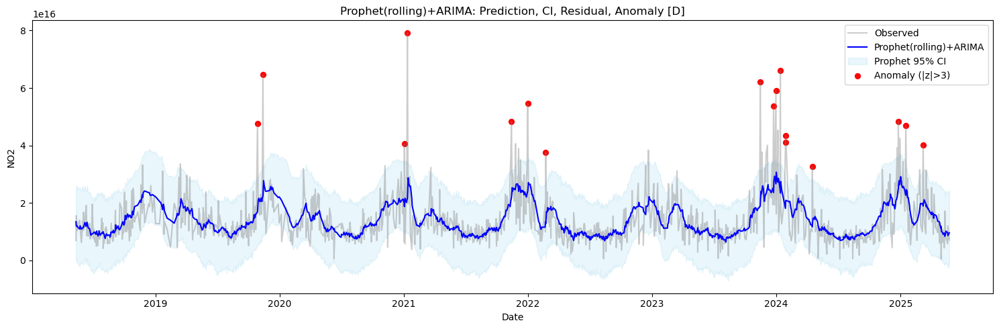

00:23:38 - cmdstanpy - INFO - Chain [1] start processing
00:23:38 - cmdstanpy - INFO - Chain [1] done processing
00:23:38 - cmdstanpy - INFO - Chain [1] start processing
00:23:38 - cmdstanpy - INFO - Chain [1] done processing
00:23:38 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:39 - cmdstanpy - INFO - Chain [1] done processing
00:23:39 - cmdstanpy - INFO - Chain [1] start processing
00:23:40 - cmdstanpy - INFO - Chain [1]

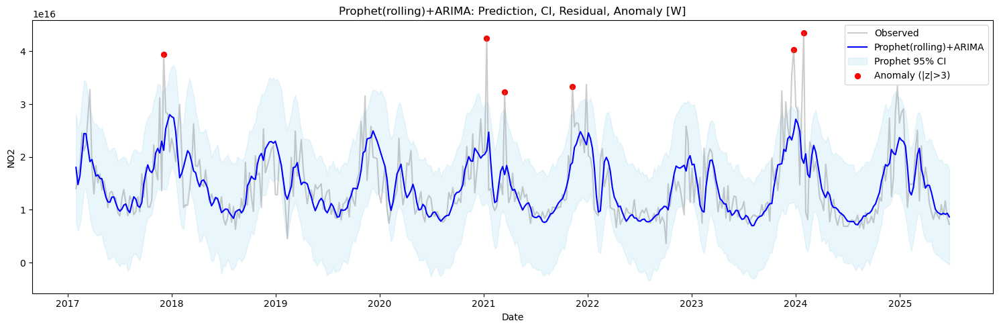

00:23:58 - cmdstanpy - INFO - Chain [1] start processing
00:23:58 - cmdstanpy - INFO - Chain [1] done processing
00:23:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:59 - cmdstanpy - INFO - Chain [1] done processing
00:23:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:59 - cmdstanpy - INFO - Chain [1] done processing
00:23:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:59 - cmdstanpy - INFO - Chain [1] done processing
00:23:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:59 - cmdstanpy - INFO - Chain [1] done processing
00:24:00 - cmdstanpy - INFO - Chain [1] start processing
00:24:00 - cmdstanpy - INFO - Chain [1] done processing
00:24:00 - cmdstanpy - INFO - Chain [1] start processing
00:24:00 - cmdstanpy - INFO - Chain [1] done processing
00:24:00 - cmdstanpy - INFO - Chain [1] start processing
00:24:01 - cmdstanpy - INFO - Chain [1] done processing
00:24:01 - cmdstanpy - INFO - Chain [1] start processing
00:24:01 - cmdstanpy - INFO - Chain [1]

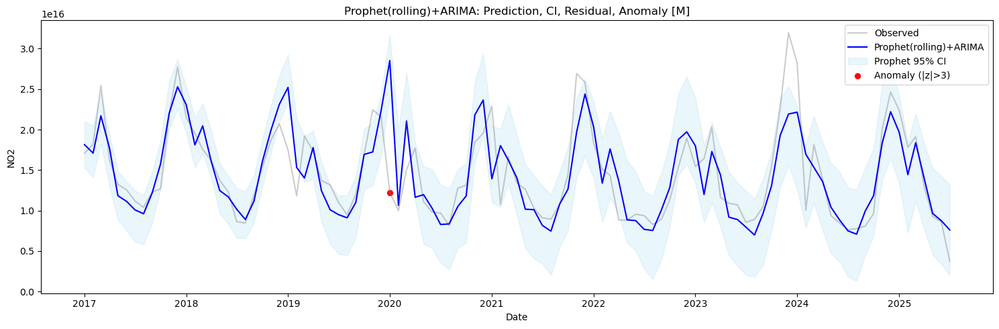

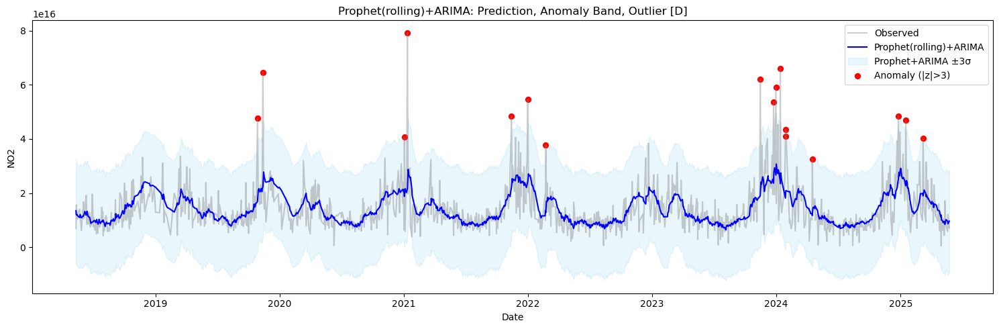

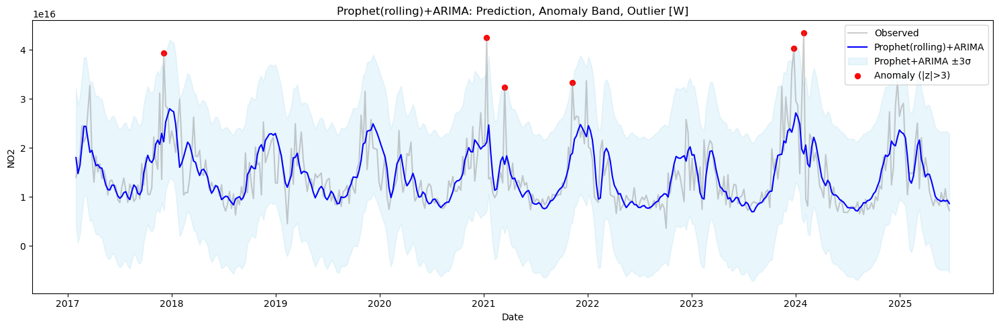

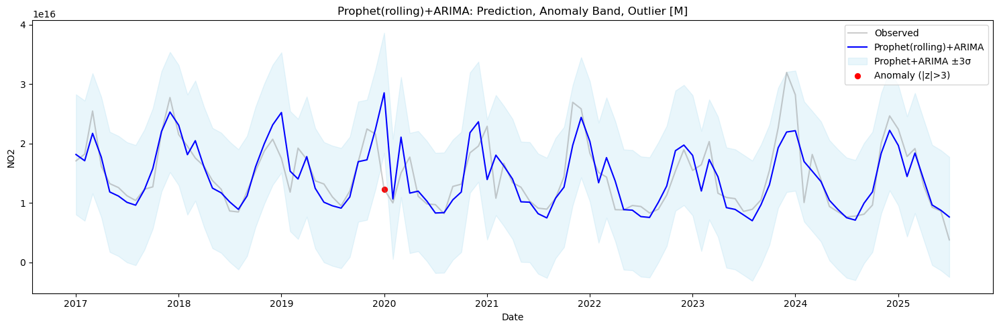

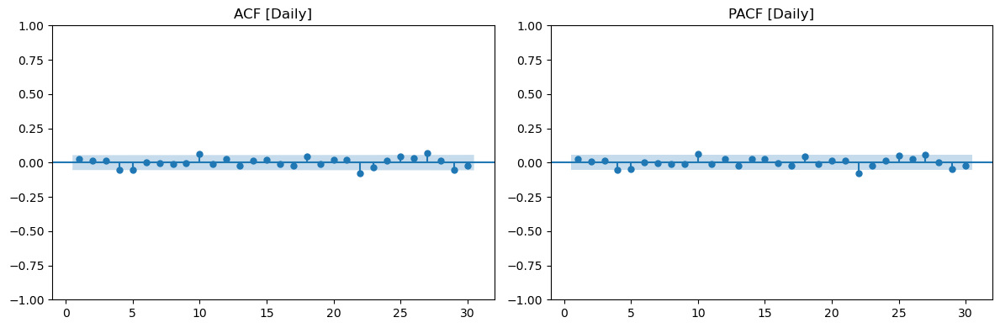

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10  13.754669   0.184479
20  20.158315   0.448066
30  45.127234   0.037562



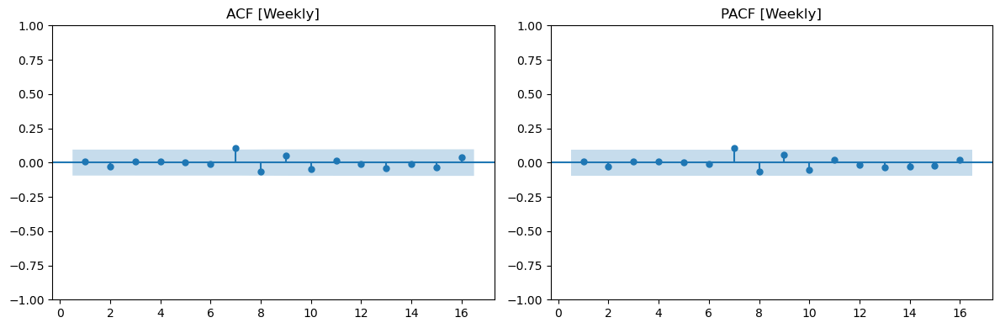

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8    6.931619   0.544028
12   9.083954   0.695743
16  11.041256   0.806932



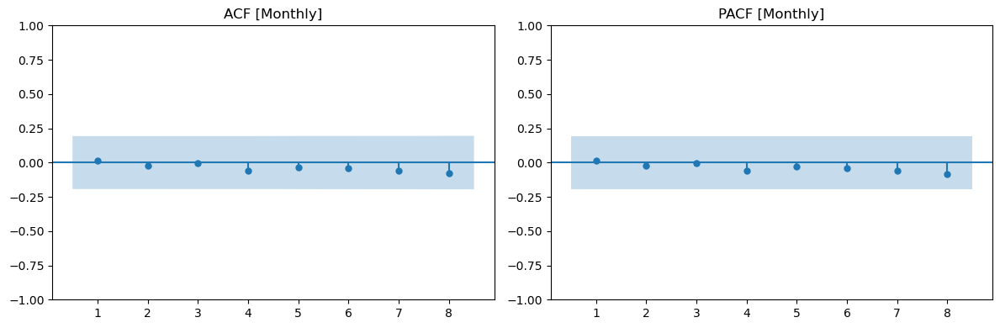

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.468016   0.976539
8  1.849388   0.985286



In [33]:
daily_result_shi_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_shi_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_shi_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(shi_df_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_shi_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_shi_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_shi_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_shi_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_shi_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_shi_nasa, lags=[4,8], title='[Monthly]')

# Beijing

In [34]:
bjg_df_NASA = pd.read_csv("data/nasa_data/beijingNO2.csv")
bjg_df_NASA = cleaning_NASA_data(bjg_df_NASA, 'NO2')
bjg_df_AQICN = pd.read_csv('data/aqicn/beijing, west park.csv')
bjg_df_AQICN = change_df(bjg_df_AQICN)

00:24:28 - cmdstanpy - INFO - Chain [1] start processing
00:24:28 - cmdstanpy - INFO - Chain [1] done processing
00:24:28 - cmdstanpy - INFO - Chain [1] start processing
00:24:28 - cmdstanpy - INFO - Chain [1] done processing
00:24:28 - cmdstanpy - INFO - Chain [1] start processing
00:24:28 - cmdstanpy - INFO - Chain [1] done processing
00:24:28 - cmdstanpy - INFO - Chain [1] start processing
00:24:29 - cmdstanpy - INFO - Chain [1] done processing
00:24:29 - cmdstanpy - INFO - Chain [1] start processing
00:24:29 - cmdstanpy - INFO - Chain [1] done processing
00:24:29 - cmdstanpy - INFO - Chain [1] start processing
00:24:29 - cmdstanpy - INFO - Chain [1] done processing
00:24:29 - cmdstanpy - INFO - Chain [1] start processing
00:24:29 - cmdstanpy - INFO - Chain [1] done processing
00:24:29 - cmdstanpy - INFO - Chain [1] start processing
00:24:29 - cmdstanpy - INFO - Chain [1] done processing
00:24:30 - cmdstanpy - INFO - Chain [1] start processing
00:24:30 - cmdstanpy - INFO - Chain [1]

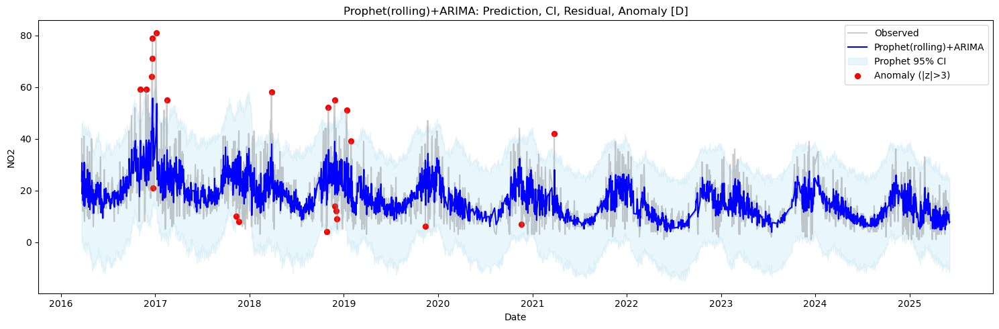

00:25:02 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:03 - cmdstanpy - INFO - Chain [1] start processing
00:25:03 - cmdstanpy - INFO - Chain [1] done processing
00:25:04 - cmdstanpy - INFO - Chain [1] start processing
00:25:04 - cmdstanpy - INFO - Chain [1] done processing
00:25:04 - cmdstanpy - INFO - Chain [1] start processing
00:25:04 - cmdstanpy - INFO - Chain [1]

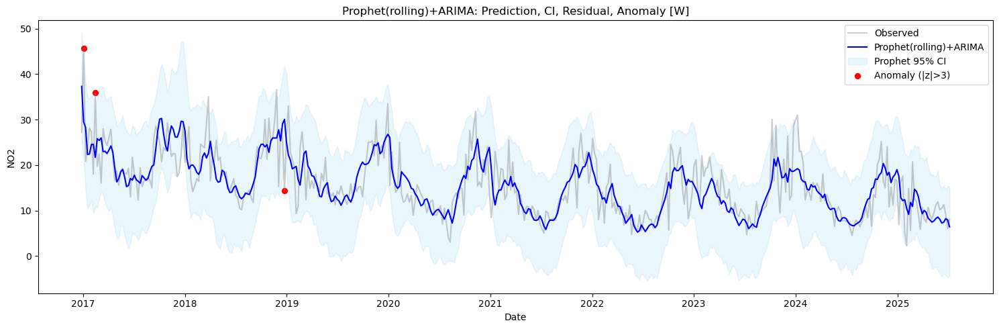

00:25:22 - cmdstanpy - INFO - Chain [1] start processing
00:25:23 - cmdstanpy - INFO - Chain [1] done processing
00:25:23 - cmdstanpy - INFO - Chain [1] start processing
00:25:23 - cmdstanpy - INFO - Chain [1] done processing
00:25:23 - cmdstanpy - INFO - Chain [1] start processing
00:25:23 - cmdstanpy - INFO - Chain [1] done processing
00:25:23 - cmdstanpy - INFO - Chain [1] start processing
00:25:23 - cmdstanpy - INFO - Chain [1] done processing
00:25:24 - cmdstanpy - INFO - Chain [1] start processing
00:25:24 - cmdstanpy - INFO - Chain [1] done processing
00:25:24 - cmdstanpy - INFO - Chain [1] start processing
00:25:24 - cmdstanpy - INFO - Chain [1] done processing
00:25:24 - cmdstanpy - INFO - Chain [1] start processing
00:25:24 - cmdstanpy - INFO - Chain [1] done processing
00:25:24 - cmdstanpy - INFO - Chain [1] start processing
00:25:24 - cmdstanpy - INFO - Chain [1] done processing
00:25:25 - cmdstanpy - INFO - Chain [1] start processing
00:25:25 - cmdstanpy - INFO - Chain [1]

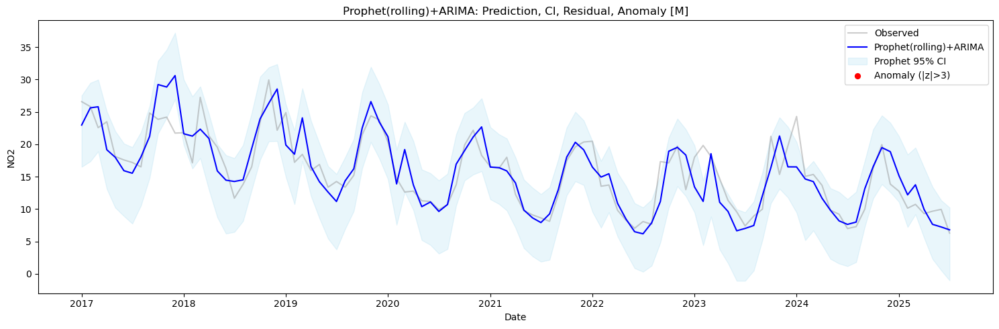

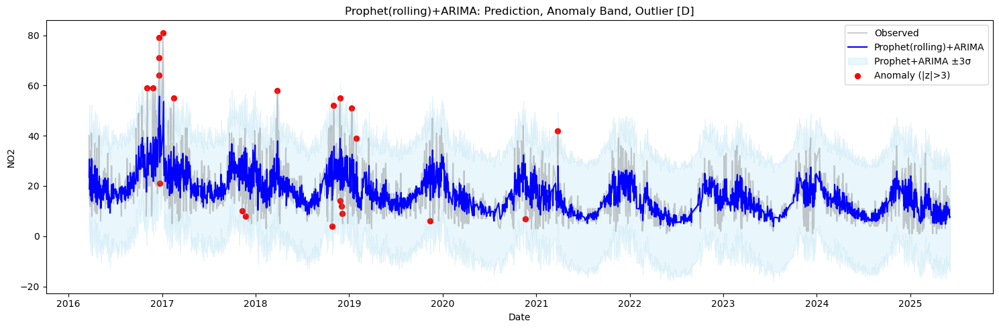

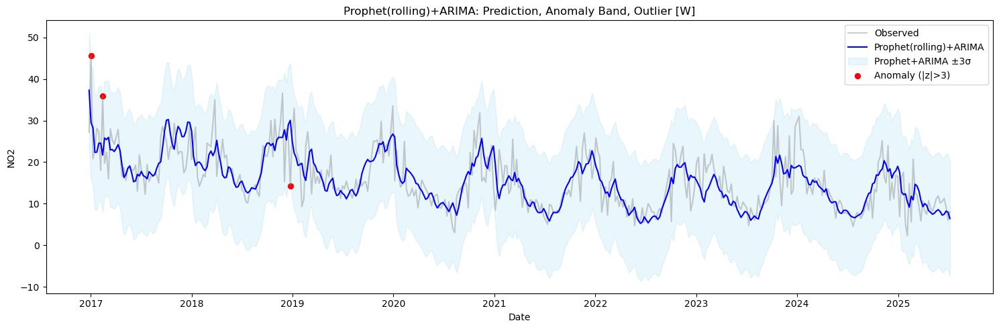

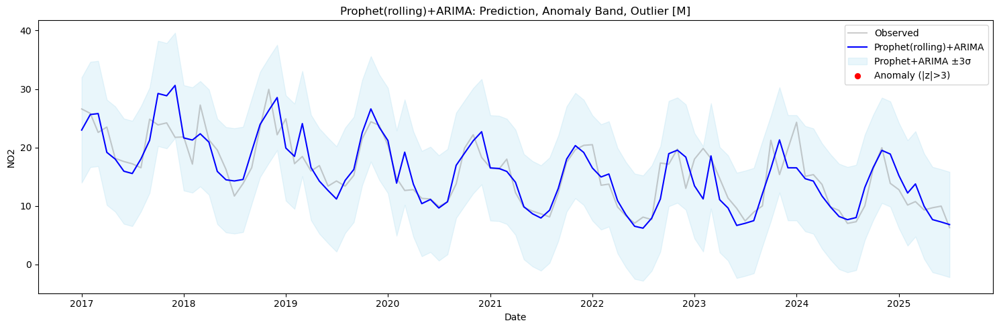

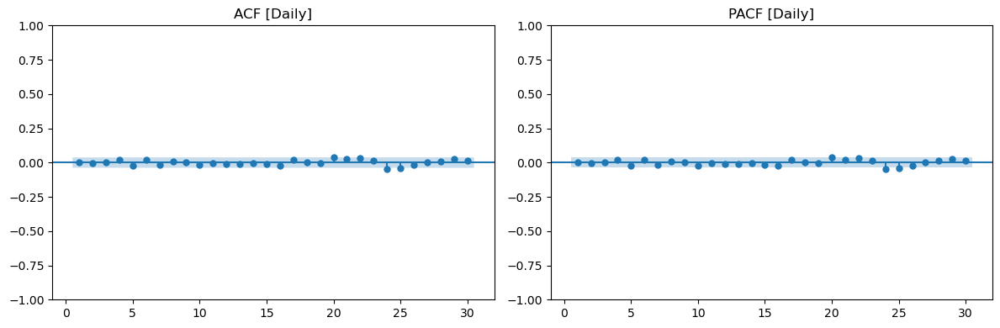

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   6.123822   0.804755
20  14.382046   0.810609
30  32.578798   0.341109



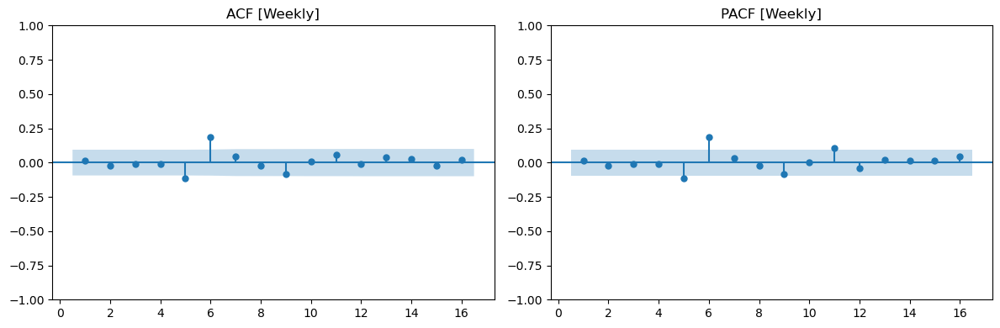

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
      lb_stat  lb_pvalue
8   21.880721   0.005142
12  26.640047   0.008703
16  27.987849   0.031725



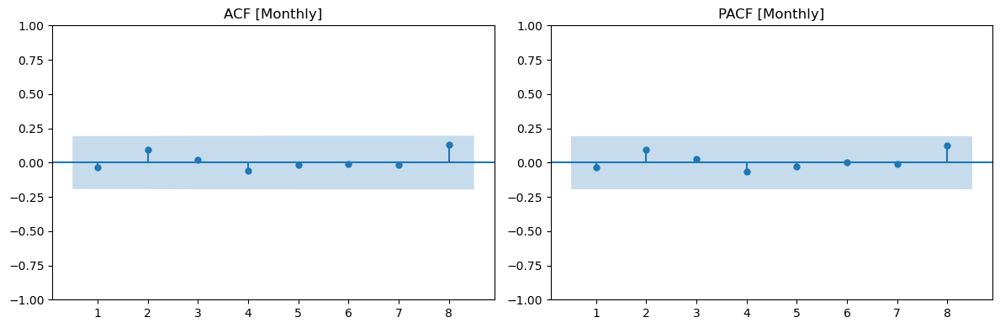

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  1.498965   0.826825
8  3.454639   0.902681



In [35]:
daily_result_bjg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_AQICN, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_bjg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_AQICN, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_bjg_aqicn = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_AQICN, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_bjg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_bjg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_bjg_aqicn, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_bjg_aqicn, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_bjg_aqicn, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_bjg_aqicn, lags=[4,8], title='[Monthly]')

00:25:52 - cmdstanpy - INFO - Chain [1] start processing
00:25:52 - cmdstanpy - INFO - Chain [1] done processing
00:25:52 - cmdstanpy - INFO - Chain [1] start processing
00:25:52 - cmdstanpy - INFO - Chain [1] done processing
00:25:52 - cmdstanpy - INFO - Chain [1] start processing
00:25:53 - cmdstanpy - INFO - Chain [1] done processing
00:25:53 - cmdstanpy - INFO - Chain [1] start processing
00:25:53 - cmdstanpy - INFO - Chain [1] done processing
00:25:53 - cmdstanpy - INFO - Chain [1] start processing
00:25:53 - cmdstanpy - INFO - Chain [1] done processing
00:25:53 - cmdstanpy - INFO - Chain [1] start processing
00:25:53 - cmdstanpy - INFO - Chain [1] done processing
00:25:53 - cmdstanpy - INFO - Chain [1] start processing
00:25:53 - cmdstanpy - INFO - Chain [1] done processing
00:25:54 - cmdstanpy - INFO - Chain [1] start processing
00:25:54 - cmdstanpy - INFO - Chain [1] done processing
00:25:54 - cmdstanpy - INFO - Chain [1] start processing
00:25:54 - cmdstanpy - INFO - Chain [1]

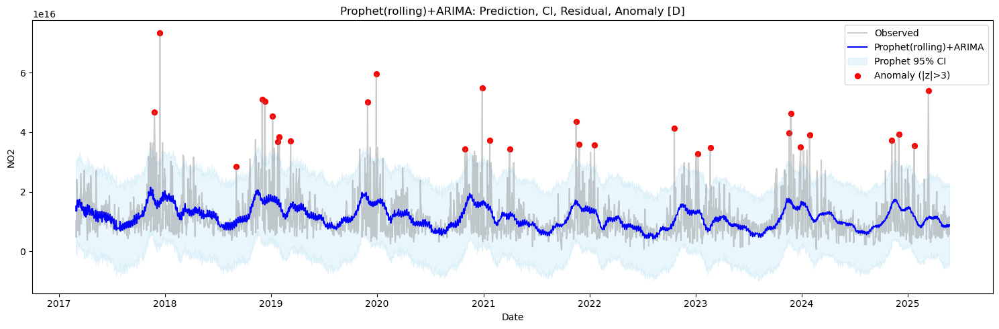

00:26:14 - cmdstanpy - INFO - Chain [1] start processing
00:26:14 - cmdstanpy - INFO - Chain [1] done processing
00:26:14 - cmdstanpy - INFO - Chain [1] start processing
00:26:14 - cmdstanpy - INFO - Chain [1] done processing
00:26:14 - cmdstanpy - INFO - Chain [1] start processing
00:26:14 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1] done processing
00:26:15 - cmdstanpy - INFO - Chain [1] start processing
00:26:15 - cmdstanpy - INFO - Chain [1]

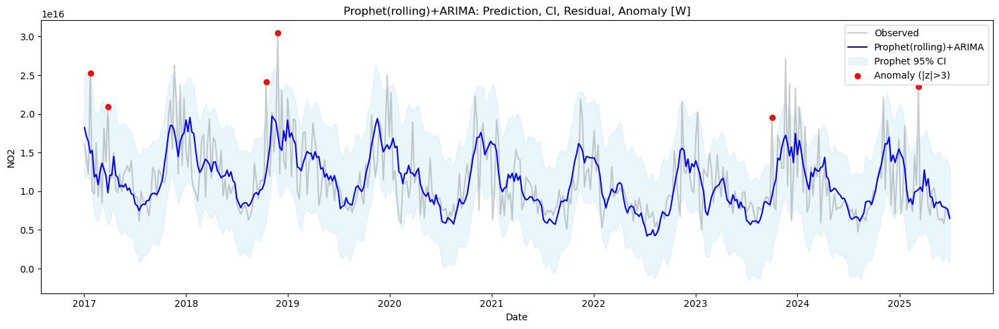

00:26:40 - cmdstanpy - INFO - Chain [1] start processing
00:26:40 - cmdstanpy - INFO - Chain [1] done processing
00:26:41 - cmdstanpy - INFO - Chain [1] start processing
00:26:41 - cmdstanpy - INFO - Chain [1] done processing
00:26:41 - cmdstanpy - INFO - Chain [1] start processing
00:26:41 - cmdstanpy - INFO - Chain [1] done processing
00:26:41 - cmdstanpy - INFO - Chain [1] start processing
00:26:41 - cmdstanpy - INFO - Chain [1] done processing
00:26:42 - cmdstanpy - INFO - Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing
00:26:42 - cmdstanpy - INFO - Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing
00:26:42 - cmdstanpy - INFO - Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing
00:26:43 - cmdstanpy - INFO - Chain [1] start processing
00:26:43 - cmdstanpy - INFO - Chain [1] done processing
00:26:43 - cmdstanpy - INFO - Chain [1] start processing
00:26:43 - cmdstanpy - INFO - Chain [1]

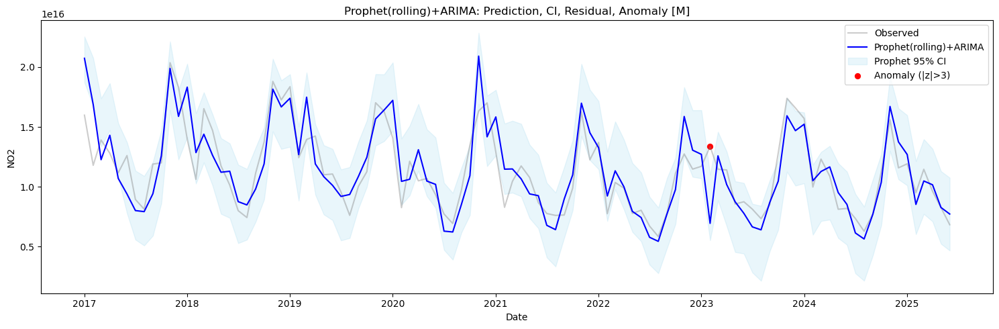

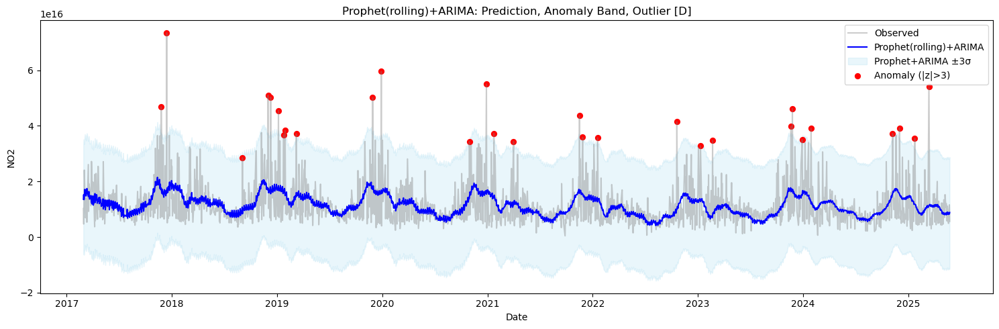

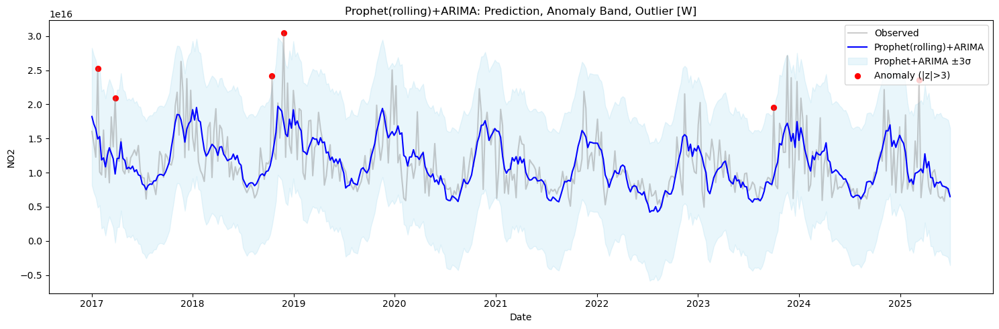

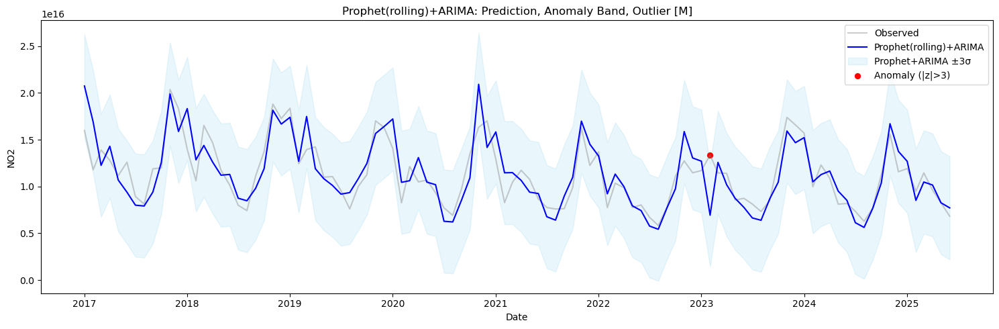

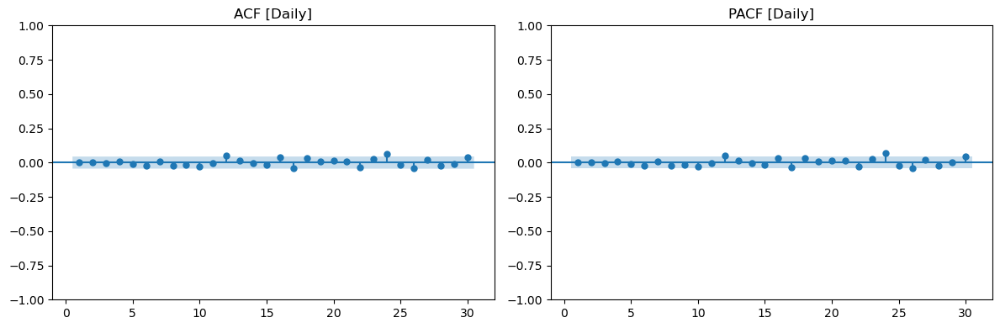

Ljung-Box Test [Daily] (using lags [10, 20, 30]):
      lb_stat  lb_pvalue
10   4.621584   0.914983
20  19.315644   0.501402
30  41.328356   0.081593



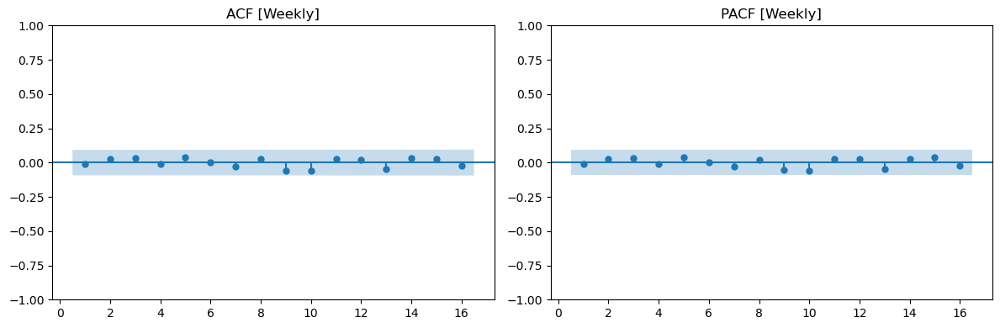

Ljung-Box Test [Weekly] (using lags [8, 12, 16]):
     lb_stat  lb_pvalue
8   2.284109   0.971040
12  5.865985   0.922686
16  7.852778   0.953129



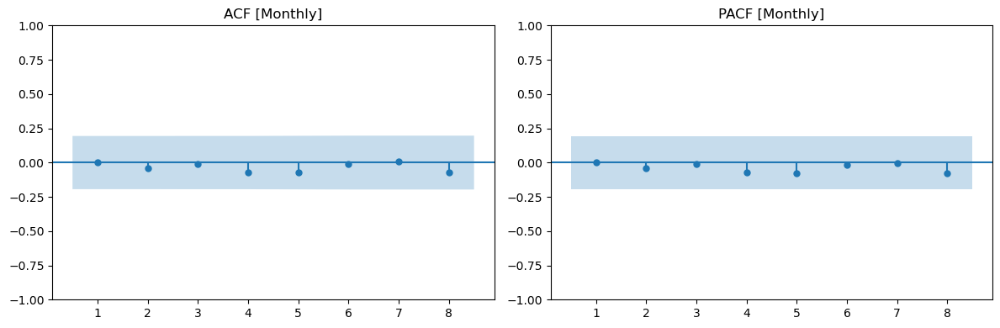

Ljung-Box Test [Monthly] (using lags [4, 8]):
    lb_stat  lb_pvalue
4  0.744211   0.945767
8  1.918237   0.983417



In [36]:
daily_result_bjg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_NASA, freq='D',pollutant='NO2'), pollutant='NO2',
    train_steps=730, test_steps=30, step=30, z_thresh=3, freq='D', plot=True
)
weekly_result_bjg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_NASA, freq='W',pollutant='NO2'), pollutant='NO2',
    train_steps=156, test_steps=8, step=4, z_thresh=3, freq='W', plot=True
)
monthly_result_bjg_nasa = rolling_prophet_forecast_CI_with_arima(
    make_agg(bjg_df_NASA, freq='M',pollutant='NO2'), pollutant='NO2',
    train_steps=36, test_steps=4, step=1, z_thresh=3, freq='M', plot=True
)

plot_arima_anomaly_band(daily_result_bjg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='D')
plot_arima_anomaly_band(weekly_result_bjg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='W')
plot_arima_anomaly_band(monthly_result_bjg_nasa, pollutant='NO2', shading_k=3, z_thresh=3, freq='M')

# Daily residual
residual_diagnostics(daily_result_bjg_nasa, lags=[10,20,30], title='[Daily]')
# Weekly residual
residual_diagnostics(weekly_result_bjg_nasa, lags=[8,12,16], title='[Weekly]')
# Monthly residual
residual_diagnostics(monthly_result_bjg_nasa, lags=[4,8], title='[Monthly]')